# Tutorial for Runnning the algorithm with 2D and 3D structural point cloud data as the input file.
## Step 1: The first step involves loading all essential packages, initializing the setup, and defining the core components required to run the algorithm's code.

In [1]:
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import ripser
from gtda.mapper import (
    CubicalCover,
    Projection,
    make_mapper_pipeline,
    plot_static_mapper_graph,
)
from gtda.mapper.utils._list_feature_union import ListFeatureUnion, _fit_transform_one, _transform_one
from gtda.plotting import plot_point_cloud
from joblib import Parallel, delayed
from matplotlib.cm import get_cmap
from scipy.sparse.csgraph import connected_components
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import DBSCAN

# --- Robust patch for gtda ListFeatureUnion with scikit-learn >= 1.4 ---
def _patched_fit_transform(self, X, y=None, **fit_params):
    self._validate_transformers()
    transformers = list(self._iter())
    results = Parallel(n_jobs=self.n_jobs)(
        delayed(_fit_transform_one)(trans, X, y, weight, **fit_params)
        for _, trans, weight in transformers
    )
    if not results:
        return []
    Xs, transformers_fitted = zip(*results)
    self._update_transformer_list(transformers_fitted)
    return list(Xs)

def _patched_transform(self, X):
    transformers = list(self._iter())
    results = Parallel(n_jobs=self.n_jobs)(
        delayed(_transform_one)(trans, X, weight)
        for _, trans, weight in transformers
    )
    if not results:
        return []
    return list(results)

ListFeatureUnion.fit_transform = _patched_fit_transform
ListFeatureUnion.transform = _patched_transform
# ------------------------------------------------------------------------

np.random.seed(42)


def calculate_diameter(xyz_points):
    """Calculate the diameter of a dataset (largest pairwise distance)."""
    distances = pdist(xyz_points)
    max_distance = np.max(distances)
    return round(max_distance)


def calculate_partitions(L, epsilon, alpha):
    """Calculate partition count (N) for length L, partition size epsilon, and overlap alpha."""
    shift = epsilon * (1 - alpha / 100)
    return math.floor((L - epsilon) / shift) + 1


def find_connected_components(data, R):
    """Find connected components in the Vietoris-Rips complex."""
    dist_matrix = squareform(pdist(data))
    adjacency_matrix = (dist_matrix <= R).astype(int)
    n_components, labels = connected_components(
        adjacency_matrix, directed=False
    )
    return [data[labels == i] for i in range(n_components)]


def plot_vietoris_rips_complex(data, R, label="data", col=1, maxdim=2):
    """Plot Vietoris-Rips complex using the endpoint scale parameter R (e*)."""
    tab10 = get_cmap("tab10")
    viridis = get_cmap("viridis")

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_title(f"Vietoris-Rips Complex (e* = {R:.4f})")

    ax.scatter(
        data[:, 0],
        data[:, 1],
        label=label,
        s=20,
        alpha=0.9,
        c=np.array([tab10(col)] * len(data)),
    )

    for xy in data:
        ax.add_patch(
            mpatches.Circle(
                xy,
                radius=R,
                fill=False,
                edgecolor=tab10(col),
                alpha=0.1,
                linestyle="dotted",
            )
        )

    for i, xy in enumerate(data):
        for j in range(i + 1, len(data)):
            pq = data[j]
            if np.linalg.norm(xy - pq) <= R:
                ax.plot(
                    [xy[0], pq[0]],
                    [xy[1], pq[1]],
                    color=tab10(col),
                    alpha=0.6,
                    linewidth=1,
                )

    if maxdim >= 2:
        triangle_index = 0
        for i, xy in enumerate(data):
            for j in range(i + 1, len(data)):
                pq = data[j]
                if np.linalg.norm(xy - pq) <= R:
                    for k_idx in range(j + 1, len(data)):
                        ab = data[k_idx]
                        if np.linalg.norm(xy - ab) <= R and np.linalg.norm(pq - ab) <= R:
                            triangle = np.array([xy, pq, ab])
                            color = viridis(triangle_index / len(data))
                            ax.fill(
                                triangle[:, 0], triangle[:, 1], color=color, alpha=0.5
                            )
                            triangle_index += 1

    ax.axis("equal")
    plt.tight_layout()
    plt.show()

    return find_connected_components(data, R)


def calculate_betti_curves(persistence_diagrams, resolution=1000):
    """Calculate Betti curves from persistence diagrams."""
    dim_0_points = persistence_diagrams[0]
    dim_1_points = persistence_diagrams[1]

    dim_0_points = dim_0_points[~np.isinf(dim_0_points[:, 1])]

    if len(dim_1_points) == 0:
        all_finite_values = dim_0_points.flatten()
    else:
        all_finite_values = np.concatenate(
            [dim_0_points.flatten(), dim_1_points.flatten()]
        )

    all_finite_values = all_finite_values[~np.isinf(all_finite_values)]
    min_val = np.min(all_finite_values)
    max_val = np.max(all_finite_values)

    x_values = np.linspace(min_val, max_val, resolution)
    betti_0 = np.zeros(resolution)
    betti_1 = np.zeros(resolution)

    for i, x in enumerate(x_values):
        betti_0[i] = np.sum((dim_0_points[:, 0] <= x) & (x <= dim_0_points[:, 1]))

    if len(dim_1_points) > 0:
        for i, x in enumerate(x_values):
            betti_1[i] = np.sum((dim_1_points[:, 0] <= x) & (x <= dim_1_points[:, 1]))

    return x_values, betti_0, betti_1


def calculate_all_betti_ranges(persistence_diagrams, resolution=1000):
    """Calculate epsilon ranges for all Betti-1 values."""
    x_values, _, betti_1 = calculate_betti_curves(
        persistence_diagrams, resolution=resolution
    )
    unique_betti_values = np.unique(betti_1)[::-1]

    betti_ranges = {}
    for betti_value in unique_betti_values:
        if betti_value == 0:
            continue

        betti_indices = np.where(betti_1 == betti_value)[0]
        if len(betti_indices) == 0:
            continue

        ranges = []
        start = betti_indices[0]
        for i in range(1, len(betti_indices)):
            if betti_indices[i] != betti_indices[i - 1] + 1:
                ranges.append((x_values[start], x_values[betti_indices[i - 1]]))
                start = betti_indices[i]
        ranges.append((x_values[start], x_values[betti_indices[-1]]))

        betti_ranges[betti_value] = ranges

    return betti_ranges


def calculate_total_ranges(betti_ranges):
    """Calculate total range per Betti number, applying a 20% multiplier for betti_1 = 1."""
    total_ranges = {}
    for betti_value, ranges in betti_ranges.items():
        if betti_value == 1:
            total_range = sum((end - start) * 0.2 for start, end in ranges)
        else:
            total_range = sum(end - start for start, end in ranges)
        total_ranges[betti_value] = total_range
    return total_ranges


def find_max_betti(total_ranges):
    """Find Betti number with highest total range."""
    max_betti = max(total_ranges, key=total_ranges.get)
    return max_betti, total_ranges[max_betti]


def calculate_mean_for_max_betti(betti_ranges, max_betti):
    """Calculate the midpoint mean of the dominant Betti-1 persistence interval."""
    ranges = betti_ranges[max_betti]
    total_len = sum(end - start for start, end in ranges)
    if total_len > 0:
        return sum(((start + end) / 2.0) * (end - start) for start, end in ranges) / total_len
    return (ranges[0][0] + ranges[0][1]) / 2.0


def calculate_endpoint_for_max_betti(betti_ranges, max_betti):
    """Calculate the end point (e*) of the range for the dominant Betti-1."""
    ranges = betti_ranges[max_betti]
    return max(end for start, end in ranges)


def plot_betti_curve_with_cutoffs(
    x_values, betti_1, betti_ranges, title_suffix=""
):
    """Plot Betti-1 curve with cutoff markers."""
    plt.figure(figsize=(10, 6))
    plt.plot(x_values, betti_1, label="Betti-1 Curve", color="blue")

    for betti_value, ranges in betti_ranges.items():
        for r in ranges:
            plt.axvline(
                x=r[0],
                color="red",
                linestyle="--",
                alpha=0.5,
                label=(
                    f"Cutoff for Betti-1={betti_value}" if r == ranges[0] else ""
                ),
            )
            plt.axvline(
                x=r[1],
                color="green",
                linestyle="--",
                alpha=0.5,
                label=f"End for Betti-1={betti_value}" if r == ranges[0] else "",
            )

    plt.xlabel("Epsilon")
    plt.ylabel("Betti-1 Value")
    plt.title(f"Betti-1 Curve with Cutoff Points {title_suffix}")
    plt.legend()
    plt.grid(True)
    plt.show()


def plot_betti_curves(persistence_diagrams, title_suffix=""):
    """Plot Betti-0 and Betti-1 curves."""
    x_vals, b0_curve, b1_curve = calculate_betti_curves(persistence_diagrams)

    plt.figure(figsize=(10, 6))
    plt.plot(x_vals, b0_curve, "b-", label="β₀ (Components)")
    plt.plot(x_vals, b1_curve, "r-", label="β₁ (Loops)")
    plt.xlabel("Threshold")
    plt.ylabel("Betti Number")
    plt.title(f"Betti Curves {title_suffix}")
    plt.legend()
    plt.grid(True)
    plt.show()


def run_topological_analysis(data_points, label_prefix="Dataset"):
    """Run persistent homology and return both mean epsilon and endpoint epsilon."""
    result = ripser.ripser(data_points, do_cocycles=False)
    persistence_diagrams = result["dgms"]

    plt.figure(figsize=(6, 6))
    for i, diagram in enumerate(persistence_diagrams):
        if len(diagram) > 0:
            plt.scatter(diagram[:, 0], diagram[:, 1], label=f"H{i}", alpha=0.5)
    plt.title(f"Persistence Diagram ({label_prefix})")
    plt.xlabel("Birth")
    plt.ylabel("Death")
    plt.legend()
    plt.grid(True)
    plt.show()

    x_values, _, betti_1 = calculate_betti_curves(persistence_diagrams)
    plot_betti_curves(persistence_diagrams, title_suffix=f"({label_prefix})")

    betti_ranges = calculate_all_betti_ranges(persistence_diagrams)

    if not betti_ranges:
        print(f"[{label_prefix}] No non-zero Betti-1 loops detected.")
        return None, None, 0, betti_ranges

    for betti_value, ranges in sorted(betti_ranges.items(), reverse=True):
        for r in ranges:
            print(
                f"[{label_prefix}] Betti-1 value {betti_value} has range [{r[0]:.4f},"
                f" {r[1]:.4f}]"
            )

    plot_betti_curve_with_cutoffs(
        x_values, betti_1, betti_ranges, title_suffix=f"({label_prefix})"
    )

    total_ranges = calculate_total_ranges(betti_ranges)
    for betti_value, total_range in sorted(total_ranges.items(), reverse=True):
        print(
            f"[{label_prefix}] Betti-1 value {betti_value} total range:"
            f" {total_range:.4f}"
        )

    max_betti, max_range = find_max_betti(total_ranges)
    print(
        f"\n[{label_prefix}] Highest range Betti-1: {max_betti} (total range ="
        f" {max_range:.4f})"
    )

    e_mean = calculate_mean_for_max_betti(betti_ranges, max_betti)
    e_endpoint = calculate_endpoint_for_max_betti(betti_ranges, max_betti)

    print(f"[{label_prefix}] Calculated Mean Epsilon (for partitions): {e_mean:.4f}")
    print(f"[{label_prefix}] Calculated Endpoint Epsilon (e* for VR complex): {e_endpoint:.4f}")

    return e_mean, e_endpoint, max_betti, betti_ranges


def process_structural_data(xyz_points, cutoff_betti):
    print("=== Step 1: Processing Baseline Data ===")
    epsilon_mean_1, epsilon_endpoint_1, Betti_1_1, _ = run_topological_analysis(
        xyz_points, label_prefix="Input Point Cloud"
    )
    print(f"Primary Mean Epsilon: {epsilon_mean_1:.4f}")
    print(f"Primary Endpoint Epsilon (e*): {epsilon_endpoint_1:.4f}")
    print(f"Primary Loop Signature (Betti_1_1): {Betti_1_1}\n")

    plot_point_cloud(xyz_points)
    L = calculate_diameter(xyz_points)
    print(f"Dataset diameter L: {L}")

    alpha_values = [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
    results = []

    for alpha in alpha_values:
        print("\n==================================================")
        print(f"Processing Mapper graph for alpha = {alpha}%")
        print("==================================================")

        N = calculate_partitions(L, epsilon_mean_1, alpha)
        print(f"For alpha = {alpha}%, N = {N} (using mean epsilon = {epsilon_mean_1:.4f})")

        filter_func = Projection(columns=[0, 1])
        cover = CubicalCover(n_intervals=N, overlap_frac=alpha / 100)
        clusterer = DBSCAN()

        pipe = make_mapper_pipeline(
            filter_func=filter_func,
            cover=cover,
            clusterer=clusterer,
            verbose=False,
            n_jobs=1,
        )

        try:
            fig = plot_static_mapper_graph(pipe, xyz_points)
            fig.show(config={"scrollZoom": True})
        except Exception as e:
            print(f"Skipping static Mapper graph rendering: {e}")

        graph = pipe.fit_transform(xyz_points)
        adjacency_matrix = graph.get_adjacency()
        adjacency_matrix = np.array(adjacency_matrix.data)

        nx_graph = nx.from_numpy_array(adjacency_matrix)
        pos = nx.spring_layout(nx_graph, iterations=100, scale=L, seed=42)
        coords = np.array(list(pos.values()))

        plt.figure(figsize=(6, 6))
        plt.scatter(coords[:, 0], coords[:, 1])
        plt.title(f"Force-directed Layout (alpha = {alpha}%)")
        plt.show()

        print(
            f"\n--- Running Topological Analysis on 2D Layout Coordinates (alpha = {alpha}%) ---"
        )
        epsilon_mean_2, epsilon_endpoint_2, Betti_1_2, _ = run_topological_analysis(
            coords, label_prefix=f"2D Layout alpha={alpha}%"
        )

        if epsilon_mean_2 is None:
            print("No valid Betti-1 loops found on 2D coordinates.")
            continue

        modulus_Betti = abs(Betti_1_1 - Betti_1_2)
        print(
            f"|Betti_1_1 - Betti_1_2| = |{Betti_1_1} - {Betti_1_2}| = {modulus_Betti}"
        )

        if modulus_Betti <= cutoff_betti:
            print("Betti condition is satisfied.")

            connected_comps = plot_vietoris_rips_complex(
                coords, R=epsilon_endpoint_2, label="simplicial complex", maxdim=2
            )
            print("Connected Components:", len(connected_comps))

            results.append({
                "%overlap": alpha,
                "N value": N,
                "Betti_1_1": Betti_1_1,
                "Betti_1_2": Betti_1_2,
                "epsilon_1_mean": round(epsilon_mean_1, 5),
                "epsilon_2_mean": round(epsilon_mean_2, 5),
                "epsilon_2_endpoint": round(epsilon_endpoint_2, 5),
            })
        else:
            print("Betti condition is not satisfied.")

    df = pd.DataFrame(results)
    print("\nResults DataFrame:")
    print(df)
    return df

def most_persistent_structural(xyz_points):
    print("=== Step 1: Processing Baseline Data ===")
    epsilon_mean_1, epsilon_endpoint_1, Betti_1_1, _ = run_topological_analysis(
        xyz_points, label_prefix="Input Point Cloud"
    )
    print(f"Primary Mean Epsilon: {epsilon_mean_1:.4f}")
    print(f"Primary Endpoint Epsilon (e*): {epsilon_endpoint_1:.4f}")
    print(f"Primary Loop Signature (Betti_1_1): {Betti_1_1}\n")


### Step 2: We here do get the random torus or the structural scatter point at random for our data, but here in this stem we need to import or get a 2D or 3D point cloud data to be used in the algorithm.

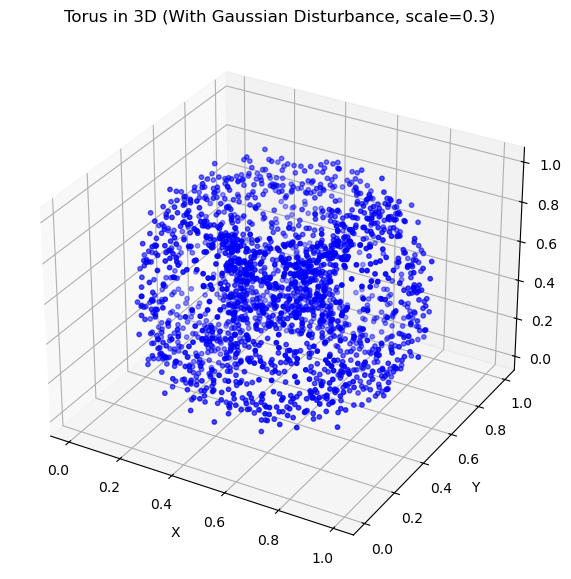

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import gudhi as gd

# Define the torus parametric equations
def torus(u, v, R=3, r=1):
    x = (R + r * np.cos(v)) * np.cos(u)
    y = (R + r * np.cos(v)) * np.sin(u)
    z = r * np.sin(v)
    return np.column_stack((x, y, z))

# Parameters
n_points = 2000  # Number of points
R = 4  # Major radius
r = 2  # Minor radius

# Generate a regular grid of u and v values
u = np.linspace(0, 2 * np.pi, n_points)
v = np.linspace(0, 2 * np.pi, n_points)
u, v = np.meshgrid(u, v)
u = u.flatten()
v = v.flatten()

# Generate torus
xyz_points = torus(u, v, R, r)

# Randomly sample a subset of points
np.random.seed(42)  # For reproducibility
sample_indices = np.random.choice(xyz_points.shape[0], size=n_points, replace=False)
xyz_points_sampled = xyz_points[sample_indices]

# --- ADD GAUSSIAN DISTURBANCE HERE ---
# noise_level controls the spread of the Gaussian noise. 
# Increase this value (e.g., 0.5, 0.8) to make the disturbance even stronger.
noise_level = 0.3 
gaussian_noise = np.random.normal(loc=0.0, scale=noise_level, size=xyz_points_sampled.shape)
xyz_points_noisy = xyz_points_sampled + gaussian_noise
# -------------------------------------

# Normalize the data to [0, 1]
def normalize_data(data):
    min_vals = np.min(data, axis=0)
    max_vals = np.max(data, axis=0)
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

# Normalize the noisy points instead of the clean ones
xyz_points_normalized = normalize_data(xyz_points_noisy)

# Plot torus in 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xyz_points_normalized[:, 0], xyz_points_normalized[:, 1], xyz_points_normalized[:, 2], c='b', s=10)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.set_title(f"Torus in 3D (With Gaussian Disturbance, scale={noise_level})")
plt.show()

### Step 3 :  We call for the function process_structural_data() to run the code with the required dependencies they are :
   #### (i) cutoff_betti : this value gives the range of tolerance for betti 1 value of mapper output with our most persistence betti   1 algorithm.
   #### (ii) xyz_points : the coordinate point data.

=== Step 1: Processing Baseline Data ===


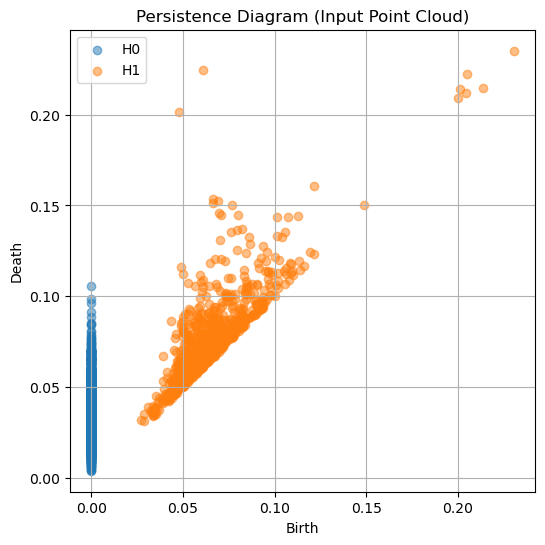

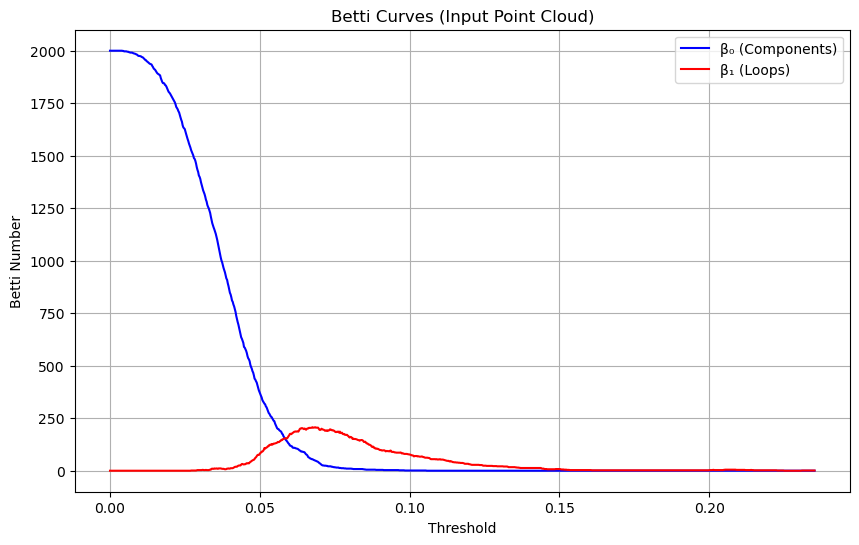

[Input Point Cloud] Betti-1 value 207.0 has range [0.0676, 0.0676]
[Input Point Cloud] Betti-1 value 207.0 has range [0.0685, 0.0685]
[Input Point Cloud] Betti-1 value 206.0 has range [0.0683, 0.0683]
[Input Point Cloud] Betti-1 value 205.0 has range [0.0673, 0.0673]
[Input Point Cloud] Betti-1 value 205.0 has range [0.0678, 0.0680]
[Input Point Cloud] Betti-1 value 205.0 has range [0.0687, 0.0694]
[Input Point Cloud] Betti-1 value 204.0 has range [0.0664, 0.0671]
[Input Point Cloud] Betti-1 value 203.0 has range [0.0640, 0.0640]
[Input Point Cloud] Betti-1 value 202.0 has range [0.0643, 0.0643]
[Input Point Cloud] Betti-1 value 201.0 has range [0.0635, 0.0638]
[Input Point Cloud] Betti-1 value 201.0 has range [0.0650, 0.0650]
[Input Point Cloud] Betti-1 value 201.0 has range [0.0659, 0.0661]
[Input Point Cloud] Betti-1 value 200.0 has range [0.0645, 0.0645]
[Input Point Cloud] Betti-1 value 200.0 has range [0.0697, 0.0697]
[Input Point Cloud] Betti-1 value 200.0 has range [0.0706, 0.0

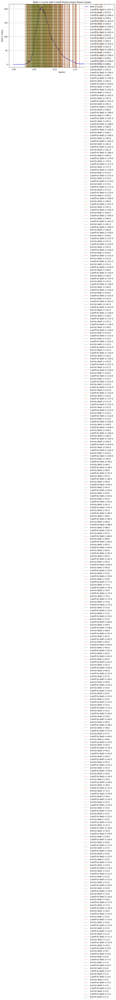

[Input Point Cloud] Betti-1 value 207.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 206.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 205.0 total range: 0.0009
[Input Point Cloud] Betti-1 value 204.0 total range: 0.0007
[Input Point Cloud] Betti-1 value 203.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 202.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 201.0 total range: 0.0005
[Input Point Cloud] Betti-1 value 200.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 199.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 198.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 197.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 196.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 195.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 194.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 193.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 192.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 191.0 

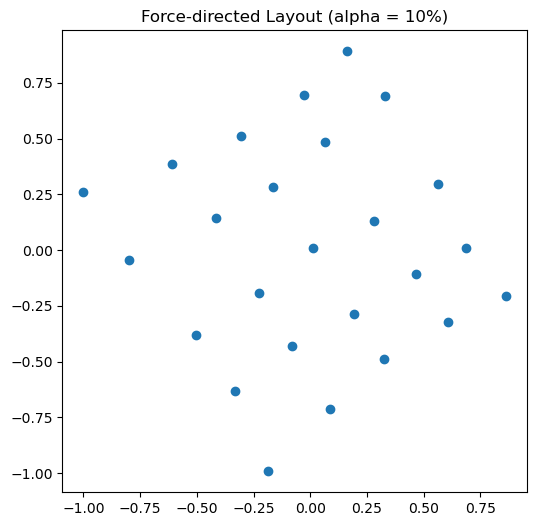


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 10%) ---


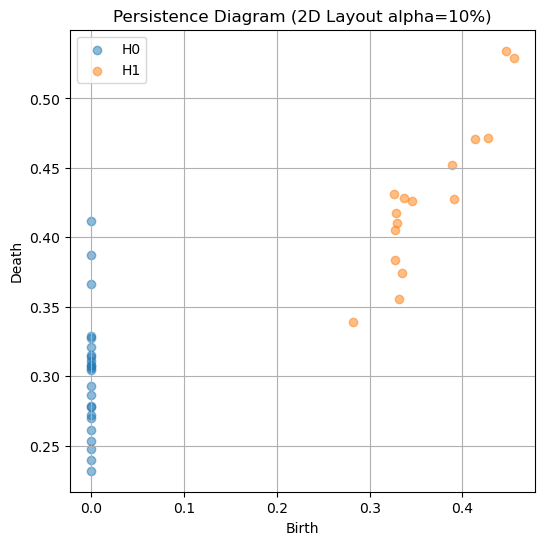

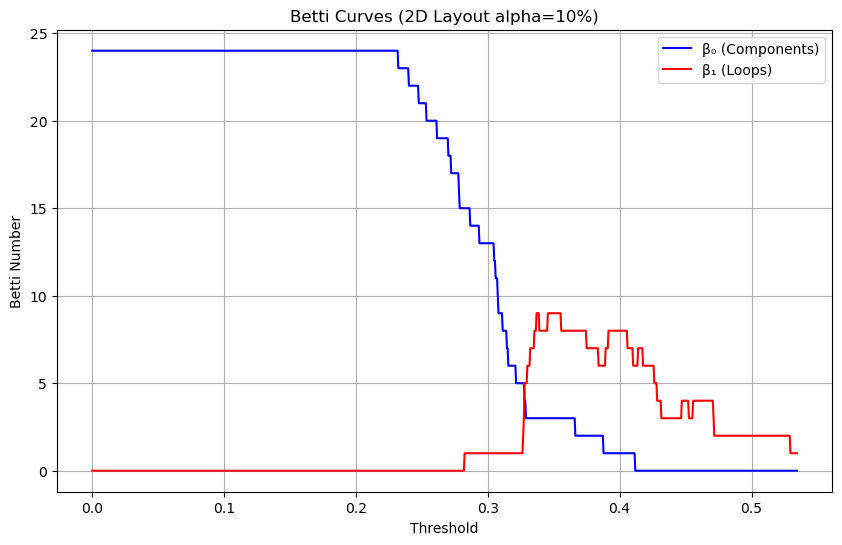

[2D Layout alpha=10%] Betti-1 value 9.0 has range [0.3370, 0.3386]
[2D Layout alpha=10%] Betti-1 value 9.0 has range [0.3455, 0.3552]
[2D Layout alpha=10%] Betti-1 value 8.0 has range [0.3354, 0.3364]
[2D Layout alpha=10%] Betti-1 value 8.0 has range [0.3391, 0.3450]
[2D Layout alpha=10%] Betti-1 value 8.0 has range [0.3557, 0.3744]
[2D Layout alpha=10%] Betti-1 value 8.0 has range [0.3915, 0.4054]
[2D Layout alpha=10%] Betti-1 value 7.0 has range [0.3322, 0.3348]
[2D Layout alpha=10%] Betti-1 value 7.0 has range [0.3749, 0.3835]
[2D Layout alpha=10%] Betti-1 value 7.0 has range [0.3894, 0.3910]
[2D Layout alpha=10%] Betti-1 value 7.0 has range [0.4060, 0.4097]
[2D Layout alpha=10%] Betti-1 value 7.0 has range [0.4140, 0.4172]
[2D Layout alpha=10%] Betti-1 value 6.0 has range [0.3300, 0.3316]
[2D Layout alpha=10%] Betti-1 value 6.0 has range [0.3840, 0.3888]
[2D Layout alpha=10%] Betti-1 value 6.0 has range [0.4102, 0.4135]
[2D Layout alpha=10%] Betti-1 value 6.0 has range [0.4177, 0.4

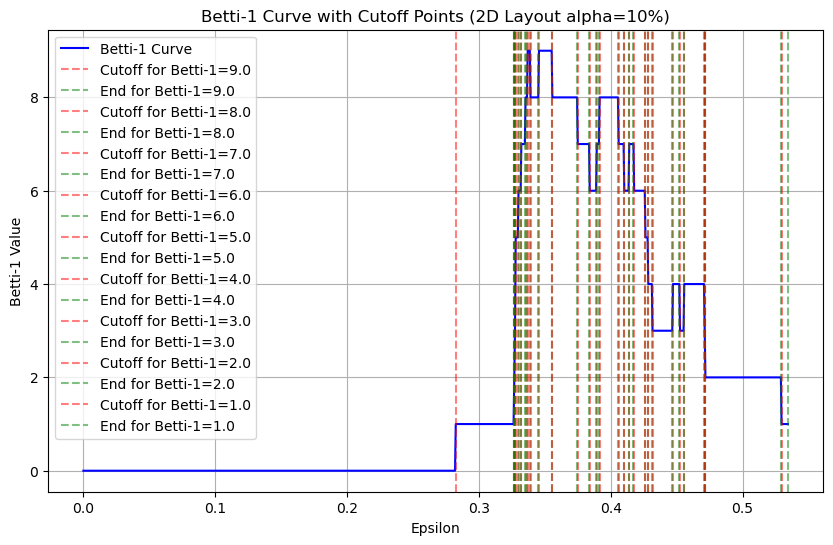

[2D Layout alpha=10%] Betti-1 value 9.0 total range: 0.0112
[2D Layout alpha=10%] Betti-1 value 8.0 total range: 0.0396
[2D Layout alpha=10%] Betti-1 value 7.0 total range: 0.0198
[2D Layout alpha=10%] Betti-1 value 6.0 total range: 0.0177
[2D Layout alpha=10%] Betti-1 value 5.0 total range: 0.0032
[2D Layout alpha=10%] Betti-1 value 4.0 total range: 0.0225
[2D Layout alpha=10%] Betti-1 value 3.0 total range: 0.0177
[2D Layout alpha=10%] Betti-1 value 2.0 total range: 0.0572
[2D Layout alpha=10%] Betti-1 value 1.0 total range: 0.0097

[2D Layout alpha=10%] Highest range Betti-1: 2.0 (total range = 0.0572)
[2D Layout alpha=10%] Calculated Mean Epsilon (for partitions): 0.5004
[2D Layout alpha=10%] Calculated Endpoint Epsilon (e* for VR complex): 0.5290
|Betti_1_1 - Betti_1_2| = |2.0 - 2.0| = 0.0
Betti condition is satisfied.


C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:78: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:79: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



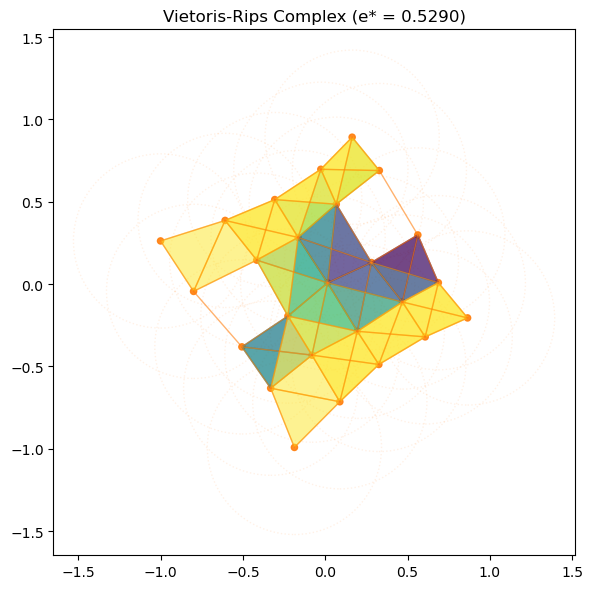

Connected Components: 1

Processing Mapper graph for alpha = 15%
For alpha = 15%, N = 6 (using mean epsilon = 0.1865)


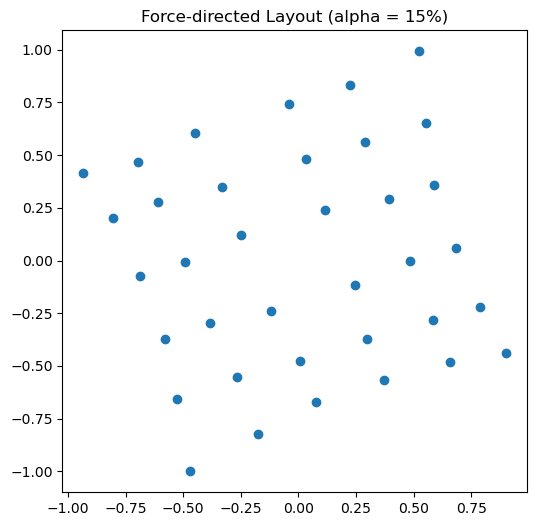


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 15%) ---


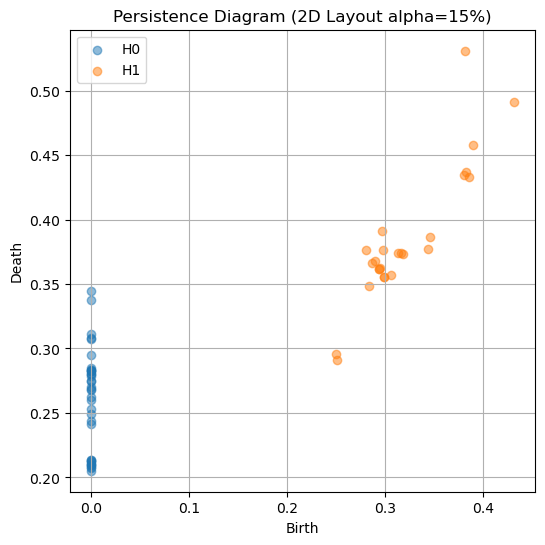

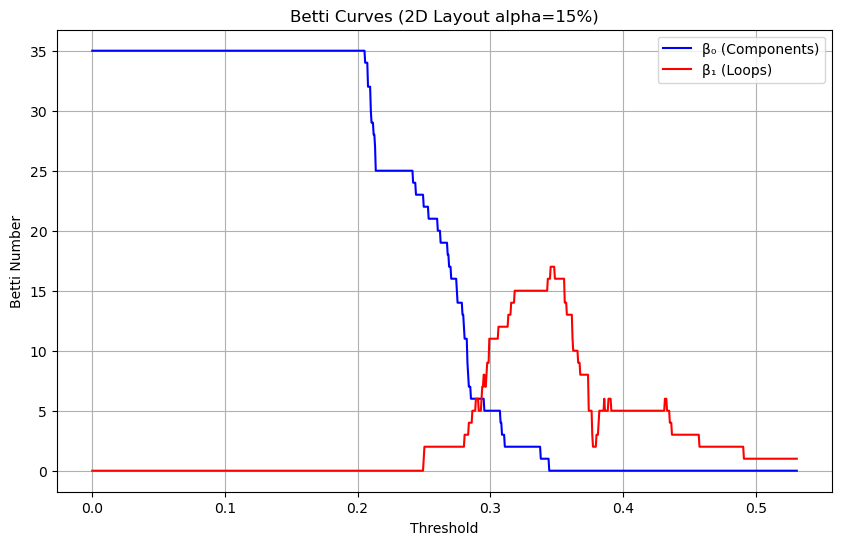

[2D Layout alpha=15%] Betti-1 value 17.0 has range [0.3455, 0.3481]
[2D Layout alpha=15%] Betti-1 value 16.0 has range [0.3433, 0.3449]
[2D Layout alpha=15%] Betti-1 value 16.0 has range [0.3487, 0.3556]
[2D Layout alpha=15%] Betti-1 value 15.0 has range [0.3184, 0.3428]
[2D Layout alpha=15%] Betti-1 value 14.0 has range [0.3157, 0.3178]
[2D Layout alpha=15%] Betti-1 value 14.0 has range [0.3561, 0.3572]
[2D Layout alpha=15%] Betti-1 value 13.0 has range [0.3136, 0.3152]
[2D Layout alpha=15%] Betti-1 value 13.0 has range [0.3577, 0.3614]
[2D Layout alpha=15%] Betti-1 value 12.0 has range [0.3061, 0.3130]
[2D Layout alpha=15%] Betti-1 value 11.0 has range [0.2992, 0.3056]
[2D Layout alpha=15%] Betti-1 value 11.0 has range [0.3619, 0.3619]
[2D Layout alpha=15%] Betti-1 value 10.0 has range [0.3625, 0.3657]
[2D Layout alpha=15%] Betti-1 value 9.0 has range [0.2976, 0.2987]
[2D Layout alpha=15%] Betti-1 value 9.0 has range [0.3662, 0.3673]
[2D Layout alpha=15%] Betti-1 value 8.0 has range 

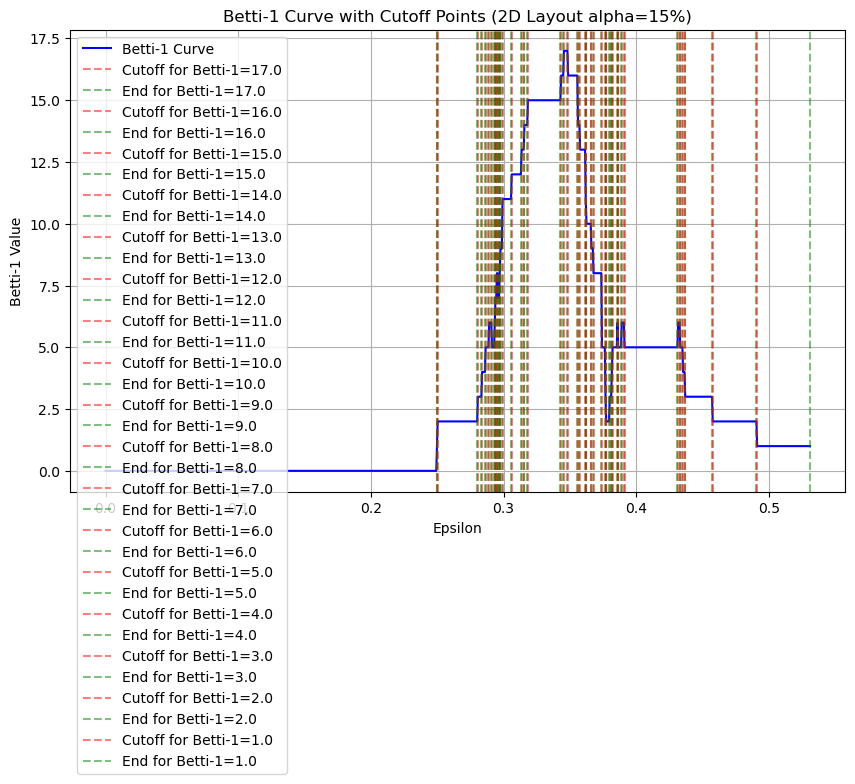

[2D Layout alpha=15%] Betti-1 value 17.0 total range: 0.0027
[2D Layout alpha=15%] Betti-1 value 16.0 total range: 0.0085
[2D Layout alpha=15%] Betti-1 value 15.0 total range: 0.0244
[2D Layout alpha=15%] Betti-1 value 14.0 total range: 0.0032
[2D Layout alpha=15%] Betti-1 value 13.0 total range: 0.0053
[2D Layout alpha=15%] Betti-1 value 12.0 total range: 0.0069
[2D Layout alpha=15%] Betti-1 value 11.0 total range: 0.0064
[2D Layout alpha=15%] Betti-1 value 10.0 total range: 0.0032
[2D Layout alpha=15%] Betti-1 value 9.0 total range: 0.0021
[2D Layout alpha=15%] Betti-1 value 8.0 total range: 0.0064
[2D Layout alpha=15%] Betti-1 value 7.0 total range: 0.0011
[2D Layout alpha=15%] Betti-1 value 6.0 total range: 0.0043
[2D Layout alpha=15%] Betti-1 value 5.0 total range: 0.0526
[2D Layout alpha=15%] Betti-1 value 4.0 total range: 0.0032
[2D Layout alpha=15%] Betti-1 value 3.0 total range: 0.0239
[2D Layout alpha=15%] Betti-1 value 2.0 total range: 0.0648
[2D Layout alpha=15%] Betti-1 va

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:78: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:79: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



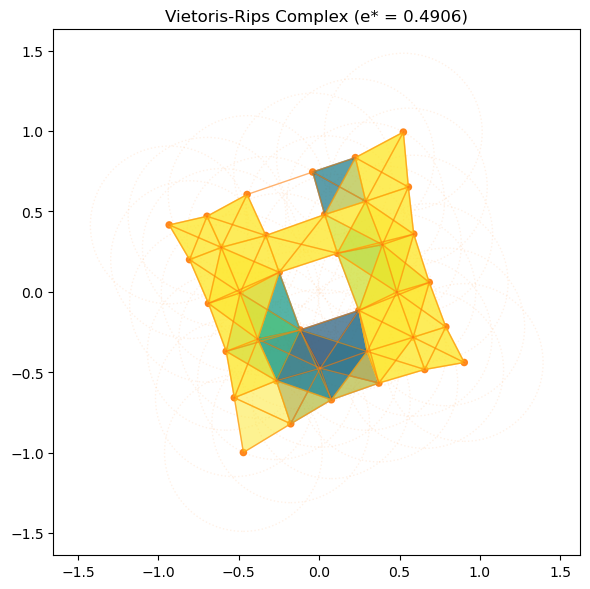

Connected Components: 1

Processing Mapper graph for alpha = 20%
For alpha = 20%, N = 6 (using mean epsilon = 0.1865)


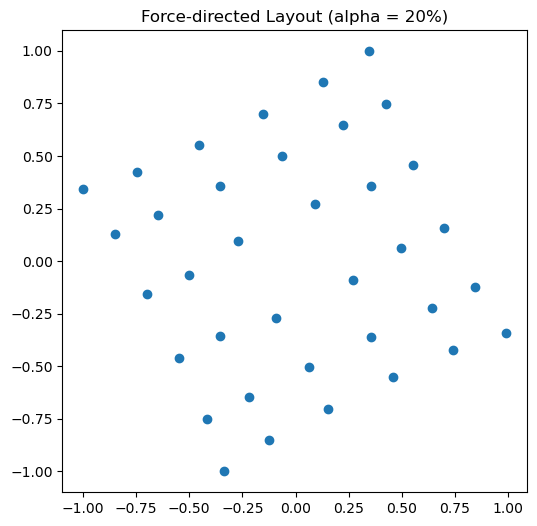


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 20%) ---


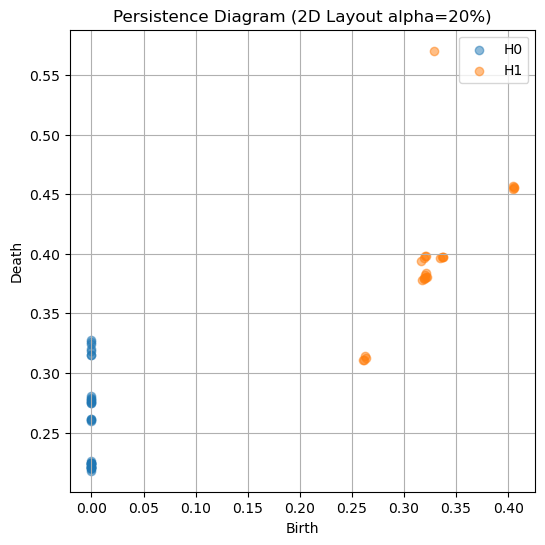

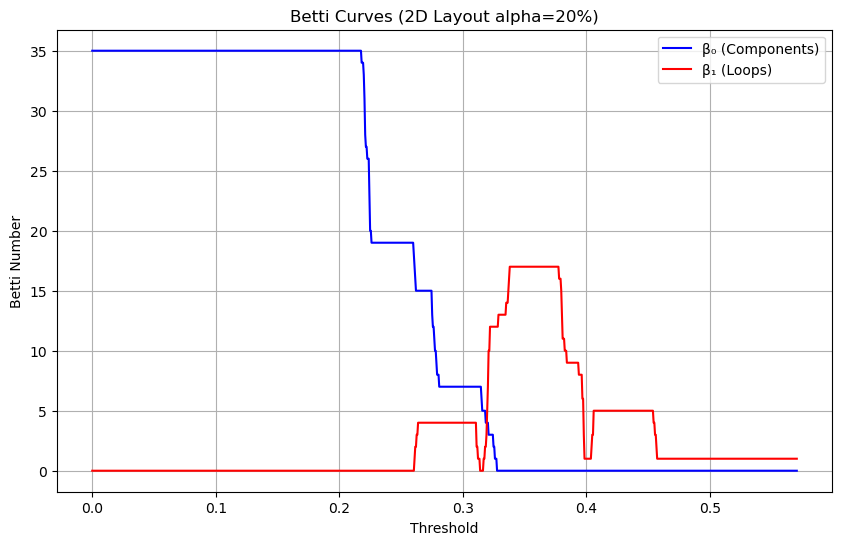

[2D Layout alpha=20%] Betti-1 value 17.0 has range [0.3379, 0.3773]
[2D Layout alpha=20%] Betti-1 value 16.0 has range [0.3374, 0.3374]
[2D Layout alpha=20%] Betti-1 value 16.0 has range [0.3779, 0.3790]
[2D Layout alpha=20%] Betti-1 value 15.0 has range [0.3368, 0.3368]
[2D Layout alpha=20%] Betti-1 value 15.0 has range [0.3796, 0.3796]
[2D Layout alpha=20%] Betti-1 value 14.0 has range [0.3351, 0.3362]
[2D Layout alpha=20%] Betti-1 value 13.0 has range [0.3288, 0.3345]
[2D Layout alpha=20%] Betti-1 value 13.0 has range [0.3802, 0.3802]
[2D Layout alpha=20%] Betti-1 value 12.0 has range [0.3220, 0.3282]
[2D Layout alpha=20%] Betti-1 value 11.0 has range [0.3808, 0.3819]
[2D Layout alpha=20%] Betti-1 value 10.0 has range [0.3208, 0.3214]
[2D Layout alpha=20%] Betti-1 value 10.0 has range [0.3825, 0.3836]
[2D Layout alpha=20%] Betti-1 value 9.0 has range [0.3842, 0.3933]
[2D Layout alpha=20%] Betti-1 value 8.0 has range [0.3939, 0.3962]
[2D Layout alpha=20%] Betti-1 value 7.0 has range 

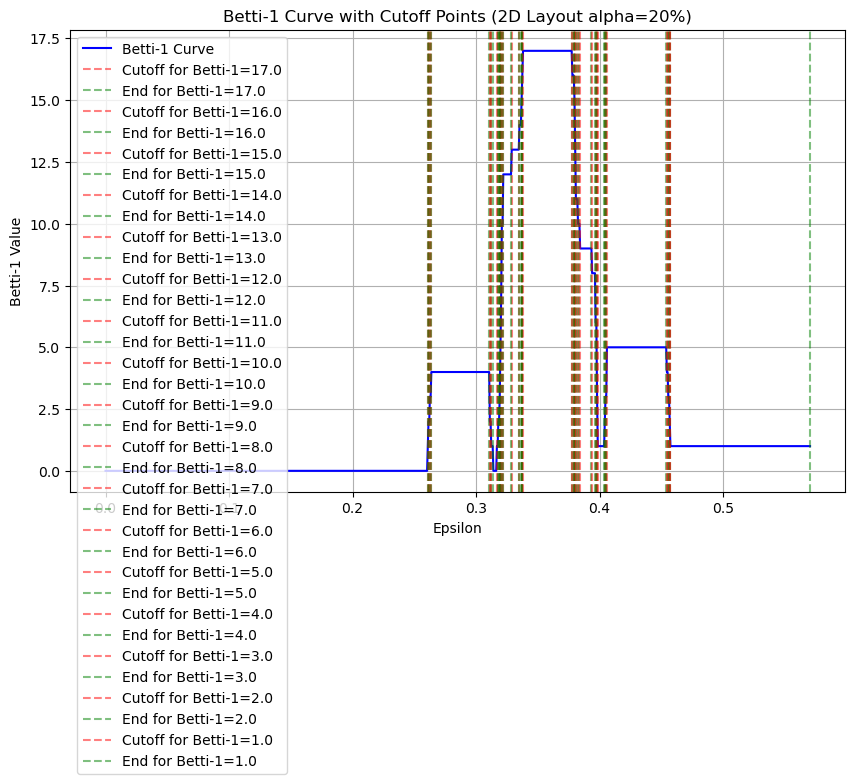

[2D Layout alpha=20%] Betti-1 value 17.0 total range: 0.0394
[2D Layout alpha=20%] Betti-1 value 16.0 total range: 0.0011
[2D Layout alpha=20%] Betti-1 value 15.0 total range: 0.0000
[2D Layout alpha=20%] Betti-1 value 14.0 total range: 0.0011
[2D Layout alpha=20%] Betti-1 value 13.0 total range: 0.0057
[2D Layout alpha=20%] Betti-1 value 12.0 total range: 0.0063
[2D Layout alpha=20%] Betti-1 value 11.0 total range: 0.0011
[2D Layout alpha=20%] Betti-1 value 10.0 total range: 0.0017
[2D Layout alpha=20%] Betti-1 value 9.0 total range: 0.0091
[2D Layout alpha=20%] Betti-1 value 8.0 total range: 0.0023
[2D Layout alpha=20%] Betti-1 value 7.0 total range: 0.0000
[2D Layout alpha=20%] Betti-1 value 6.0 total range: 0.0006
[2D Layout alpha=20%] Betti-1 value 5.0 total range: 0.0480
[2D Layout alpha=20%] Betti-1 value 4.0 total range: 0.0474
[2D Layout alpha=20%] Betti-1 value 3.0 total range: 0.0017
[2D Layout alpha=20%] Betti-1 value 2.0 total range: 0.0017
[2D Layout alpha=20%] Betti-1 va

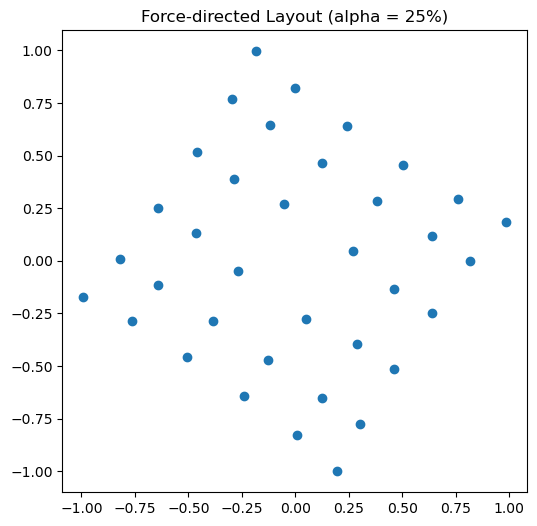


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 25%) ---


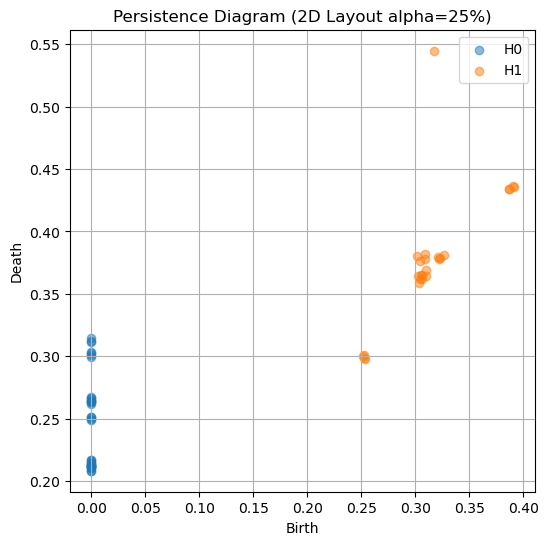

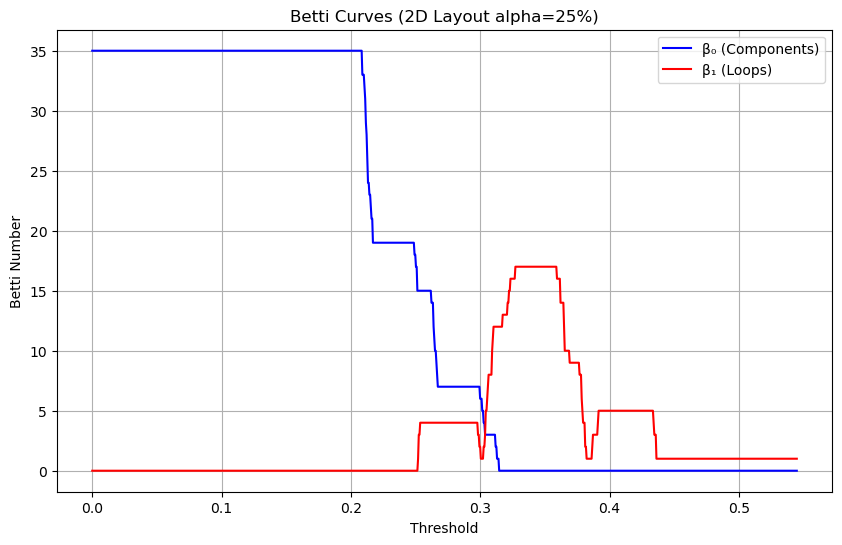

[2D Layout alpha=25%] Betti-1 value 17.0 has range [0.3272, 0.3588]
[2D Layout alpha=25%] Betti-1 value 16.0 has range [0.3234, 0.3266]
[2D Layout alpha=25%] Betti-1 value 16.0 has range [0.3594, 0.3615]
[2D Layout alpha=25%] Betti-1 value 15.0 has range [0.3223, 0.3228]
[2D Layout alpha=25%] Betti-1 value 14.0 has range [0.3212, 0.3217]
[2D Layout alpha=25%] Betti-1 value 14.0 has range [0.3621, 0.3643]
[2D Layout alpha=25%] Betti-1 value 13.0 has range [0.3174, 0.3206]
[2D Layout alpha=25%] Betti-1 value 12.0 has range [0.3103, 0.3168]
[2D Layout alpha=25%] Betti-1 value 12.0 has range [0.3648, 0.3648]
[2D Layout alpha=25%] Betti-1 value 11.0 has range [0.3097, 0.3097]
[2D Layout alpha=25%] Betti-1 value 10.0 has range [0.3092, 0.3092]
[2D Layout alpha=25%] Betti-1 value 10.0 has range [0.3654, 0.3686]
[2D Layout alpha=25%] Betti-1 value 9.0 has range [0.3692, 0.3763]
[2D Layout alpha=25%] Betti-1 value 8.0 has range [0.3065, 0.3087]
[2D Layout alpha=25%] Betti-1 value 8.0 has range 

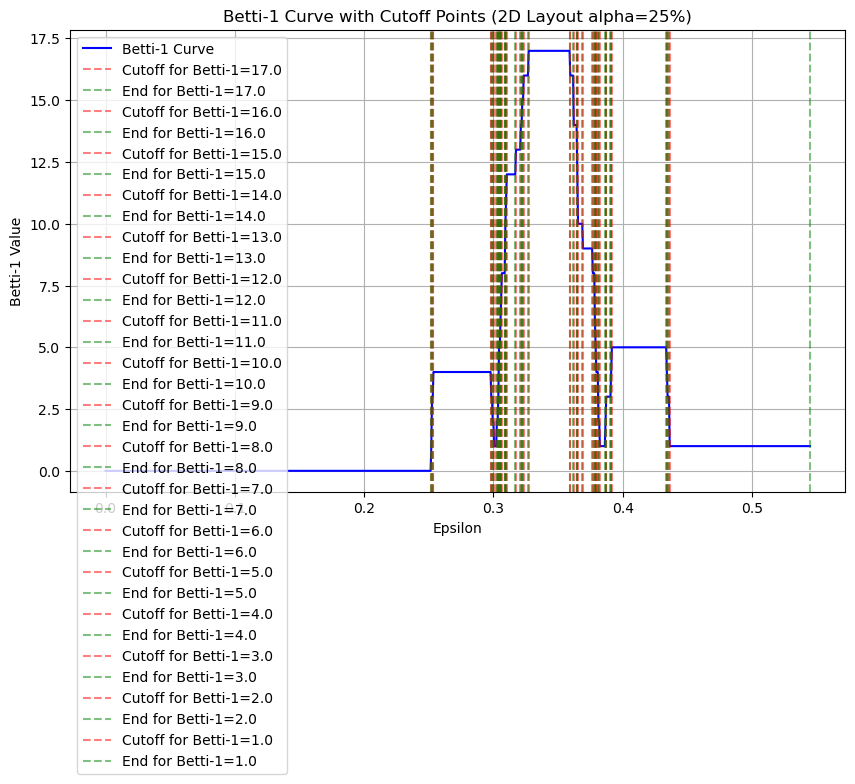

[2D Layout alpha=25%] Betti-1 value 17.0 total range: 0.0316
[2D Layout alpha=25%] Betti-1 value 16.0 total range: 0.0055
[2D Layout alpha=25%] Betti-1 value 15.0 total range: 0.0005
[2D Layout alpha=25%] Betti-1 value 14.0 total range: 0.0027
[2D Layout alpha=25%] Betti-1 value 13.0 total range: 0.0033
[2D Layout alpha=25%] Betti-1 value 12.0 total range: 0.0065
[2D Layout alpha=25%] Betti-1 value 11.0 total range: 0.0000
[2D Layout alpha=25%] Betti-1 value 10.0 total range: 0.0033
[2D Layout alpha=25%] Betti-1 value 9.0 total range: 0.0071
[2D Layout alpha=25%] Betti-1 value 8.0 total range: 0.0033
[2D Layout alpha=25%] Betti-1 value 7.0 total range: 0.0000
[2D Layout alpha=25%] Betti-1 value 6.0 total range: 0.0000
[2D Layout alpha=25%] Betti-1 value 5.0 total range: 0.0425
[2D Layout alpha=25%] Betti-1 value 4.0 total range: 0.0453
[2D Layout alpha=25%] Betti-1 value 3.0 total range: 0.0055
[2D Layout alpha=25%] Betti-1 value 2.0 total range: 0.0016
[2D Layout alpha=25%] Betti-1 va

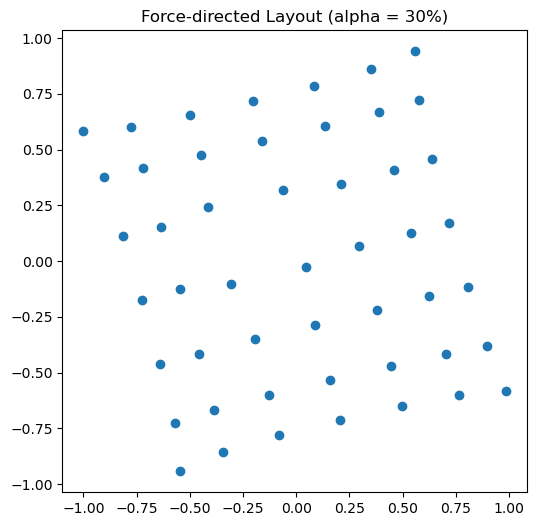


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 30%) ---


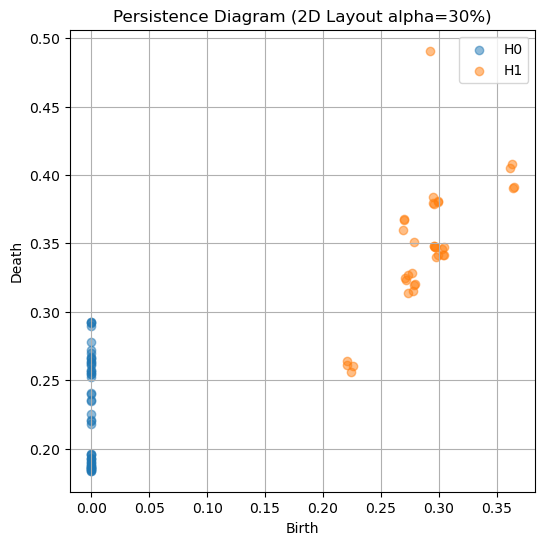

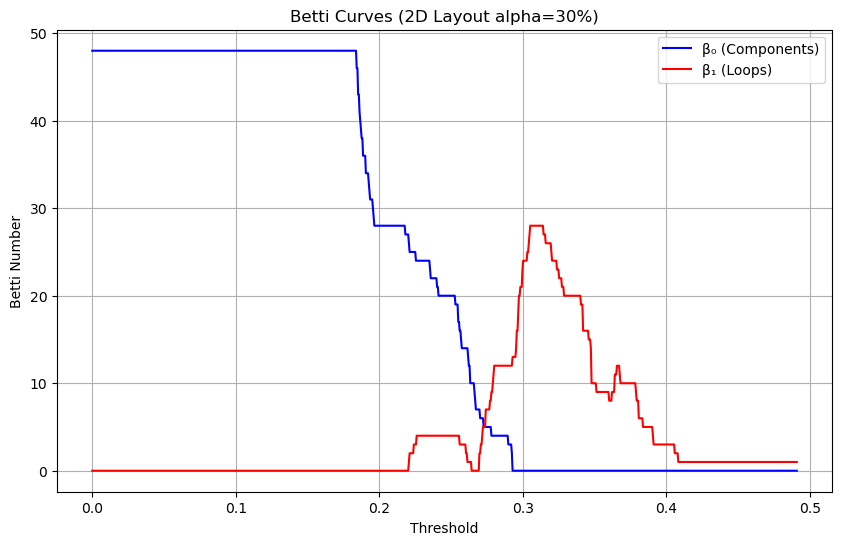

[2D Layout alpha=30%] Betti-1 value 28.0 has range [0.3051, 0.3139]
[2D Layout alpha=30%] Betti-1 value 27.0 has range [0.3046, 0.3046]
[2D Layout alpha=30%] Betti-1 value 27.0 has range [0.3144, 0.3154]
[2D Layout alpha=30%] Betti-1 value 26.0 has range [0.3041, 0.3041]
[2D Layout alpha=30%] Betti-1 value 26.0 has range [0.3159, 0.3193]
[2D Layout alpha=30%] Betti-1 value 25.0 has range [0.3031, 0.3036]
[2D Layout alpha=30%] Betti-1 value 25.0 has range [0.3198, 0.3198]
[2D Layout alpha=30%] Betti-1 value 24.0 has range [0.3002, 0.3026]
[2D Layout alpha=30%] Betti-1 value 24.0 has range [0.3203, 0.3233]
[2D Layout alpha=30%] Betti-1 value 23.0 has range [0.2997, 0.2997]
[2D Layout alpha=30%] Betti-1 value 23.0 has range [0.3237, 0.3247]
[2D Layout alpha=30%] Betti-1 value 22.0 has range [0.3252, 0.3267]
[2D Layout alpha=30%] Betti-1 value 21.0 has range [0.2982, 0.2992]
[2D Layout alpha=30%] Betti-1 value 21.0 has range [0.3272, 0.3282]
[2D Layout alpha=30%] Betti-1 value 20.0 has ran

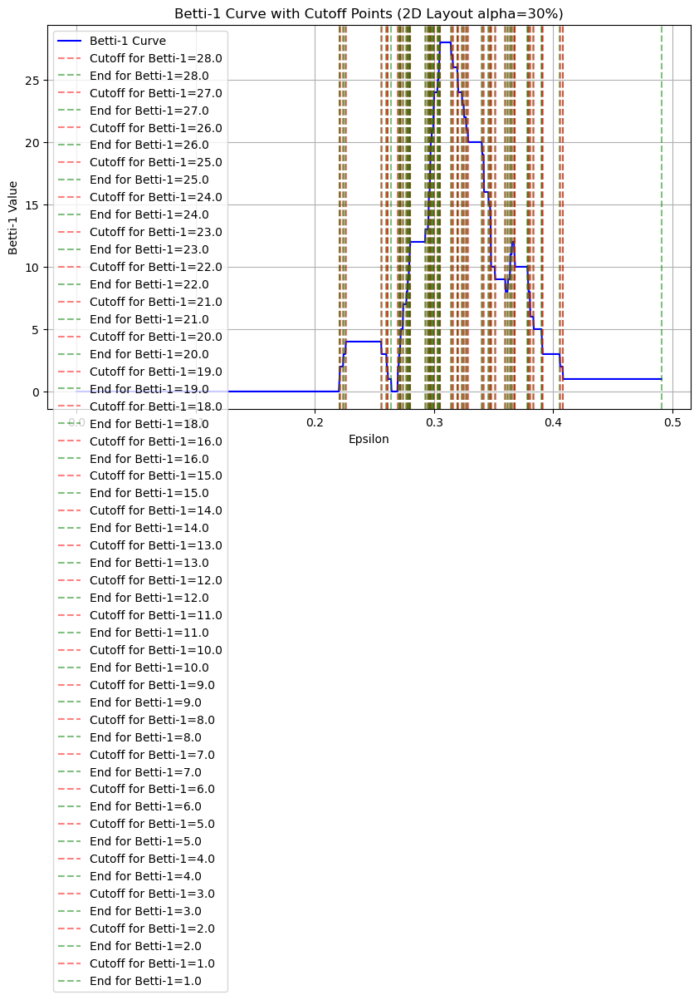

[2D Layout alpha=30%] Betti-1 value 28.0 total range: 0.0088
[2D Layout alpha=30%] Betti-1 value 27.0 total range: 0.0010
[2D Layout alpha=30%] Betti-1 value 26.0 total range: 0.0034
[2D Layout alpha=30%] Betti-1 value 25.0 total range: 0.0005
[2D Layout alpha=30%] Betti-1 value 24.0 total range: 0.0054
[2D Layout alpha=30%] Betti-1 value 23.0 total range: 0.0010
[2D Layout alpha=30%] Betti-1 value 22.0 total range: 0.0015
[2D Layout alpha=30%] Betti-1 value 21.0 total range: 0.0020
[2D Layout alpha=30%] Betti-1 value 20.0 total range: 0.0118
[2D Layout alpha=30%] Betti-1 value 19.0 total range: 0.0010
[2D Layout alpha=30%] Betti-1 value 18.0 total range: 0.0000
[2D Layout alpha=30%] Betti-1 value 16.0 total range: 0.0039
[2D Layout alpha=30%] Betti-1 value 15.0 total range: 0.0010
[2D Layout alpha=30%] Betti-1 value 14.0 total range: 0.0000
[2D Layout alpha=30%] Betti-1 value 13.0 total range: 0.0020
[2D Layout alpha=30%] Betti-1 value 12.0 total range: 0.0138
[2D Layout alpha=30%] Be

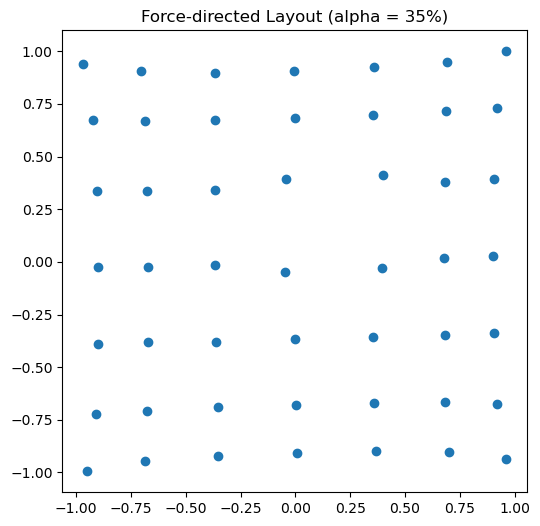


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 35%) ---


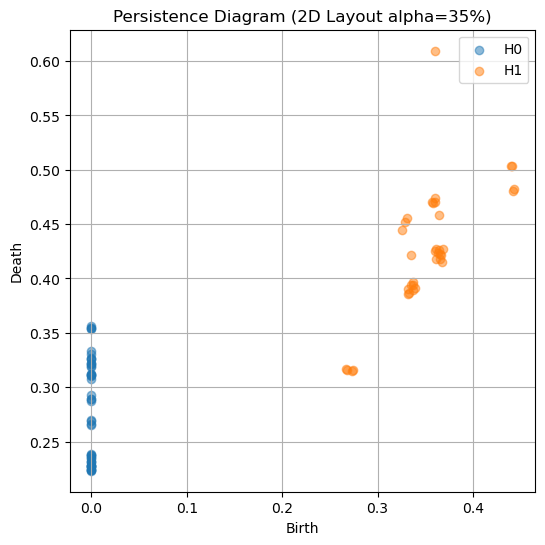

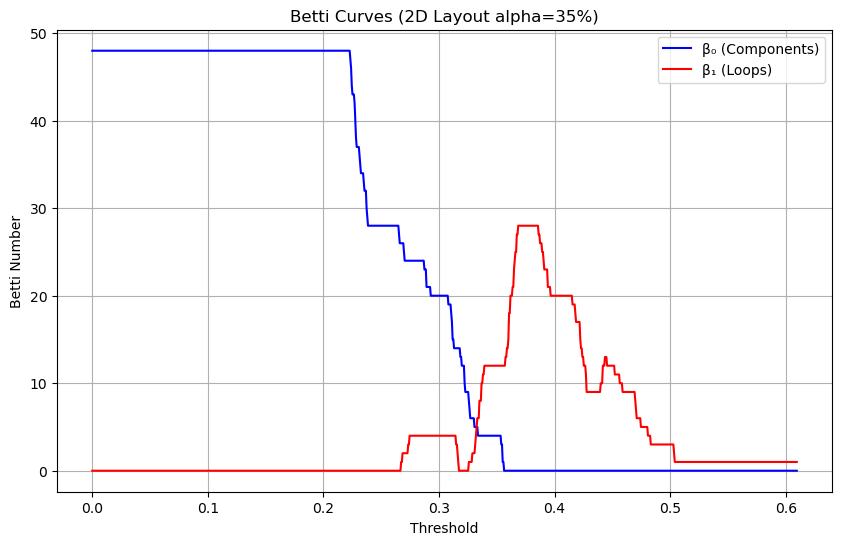

[2D Layout alpha=35%] Betti-1 value 28.0 has range [0.3685, 0.3856]
[2D Layout alpha=35%] Betti-1 value 27.0 has range [0.3673, 0.3679]
[2D Layout alpha=35%] Betti-1 value 27.0 has range [0.3862, 0.3868]
[2D Layout alpha=35%] Betti-1 value 26.0 has range [0.3874, 0.3887]
[2D Layout alpha=35%] Betti-1 value 25.0 has range [0.3661, 0.3667]
[2D Layout alpha=35%] Betti-1 value 25.0 has range [0.3893, 0.3899]
[2D Layout alpha=35%] Betti-1 value 24.0 has range [0.3655, 0.3655]
[2D Layout alpha=35%] Betti-1 value 24.0 has range [0.3905, 0.3905]
[2D Layout alpha=35%] Betti-1 value 23.0 has range [0.3649, 0.3649]
[2D Layout alpha=35%] Betti-1 value 23.0 has range [0.3911, 0.3935]
[2D Layout alpha=35%] Betti-1 value 21.0 has range [0.3636, 0.3643]
[2D Layout alpha=35%] Betti-1 value 21.0 has range [0.3942, 0.3960]
[2D Layout alpha=35%] Betti-1 value 20.0 has range [0.3618, 0.3630]
[2D Layout alpha=35%] Betti-1 value 20.0 has range [0.3966, 0.4149]
[2D Layout alpha=35%] Betti-1 value 19.0 has ran

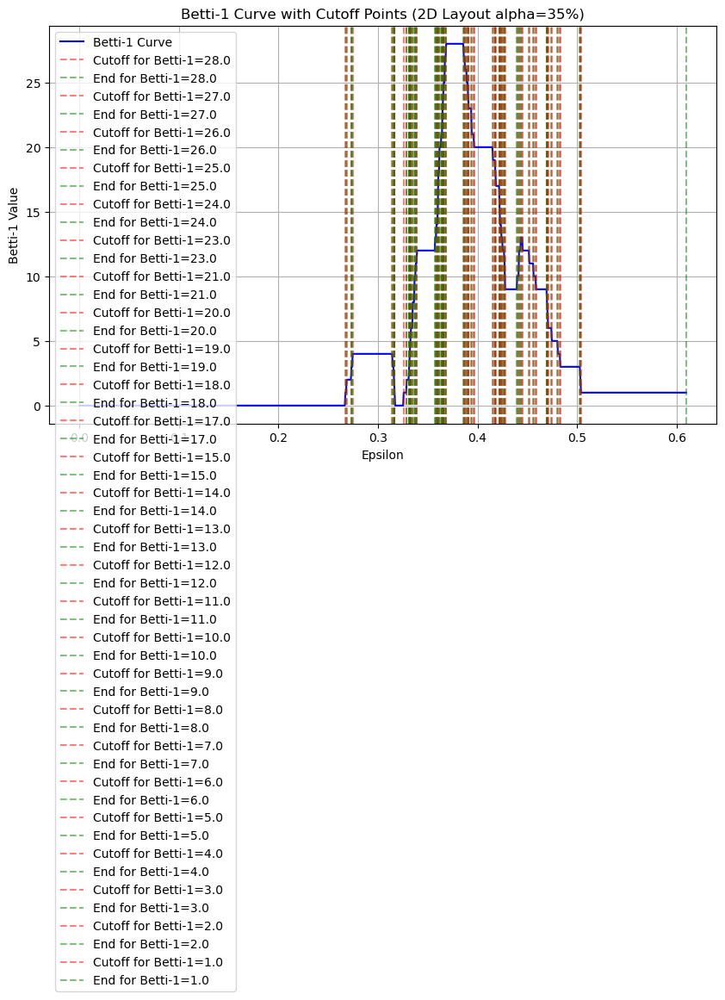

[2D Layout alpha=35%] Betti-1 value 28.0 total range: 0.0171
[2D Layout alpha=35%] Betti-1 value 27.0 total range: 0.0012
[2D Layout alpha=35%] Betti-1 value 26.0 total range: 0.0012
[2D Layout alpha=35%] Betti-1 value 25.0 total range: 0.0012
[2D Layout alpha=35%] Betti-1 value 24.0 total range: 0.0000
[2D Layout alpha=35%] Betti-1 value 23.0 total range: 0.0024
[2D Layout alpha=35%] Betti-1 value 21.0 total range: 0.0024
[2D Layout alpha=35%] Betti-1 value 20.0 total range: 0.0195
[2D Layout alpha=35%] Betti-1 value 19.0 total range: 0.0018
[2D Layout alpha=35%] Betti-1 value 18.0 total range: 0.0006
[2D Layout alpha=35%] Betti-1 value 17.0 total range: 0.0031
[2D Layout alpha=35%] Betti-1 value 15.0 total range: 0.0000
[2D Layout alpha=35%] Betti-1 value 14.0 total range: 0.0012
[2D Layout alpha=35%] Betti-1 value 13.0 total range: 0.0024
[2D Layout alpha=35%] Betti-1 value 12.0 total range: 0.0262
[2D Layout alpha=35%] Betti-1 value 11.0 total range: 0.0043
[2D Layout alpha=35%] Be

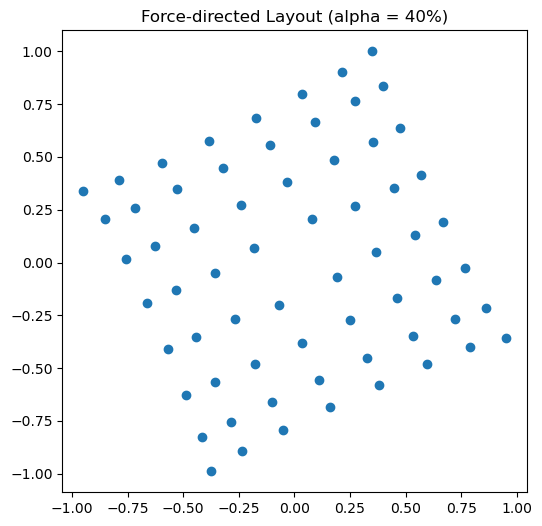


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 40%) ---


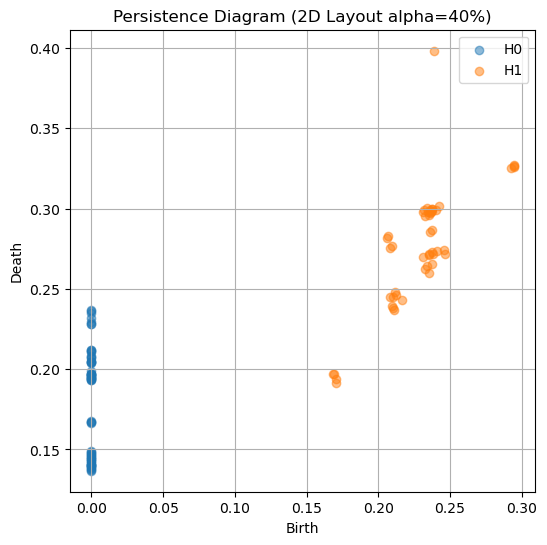

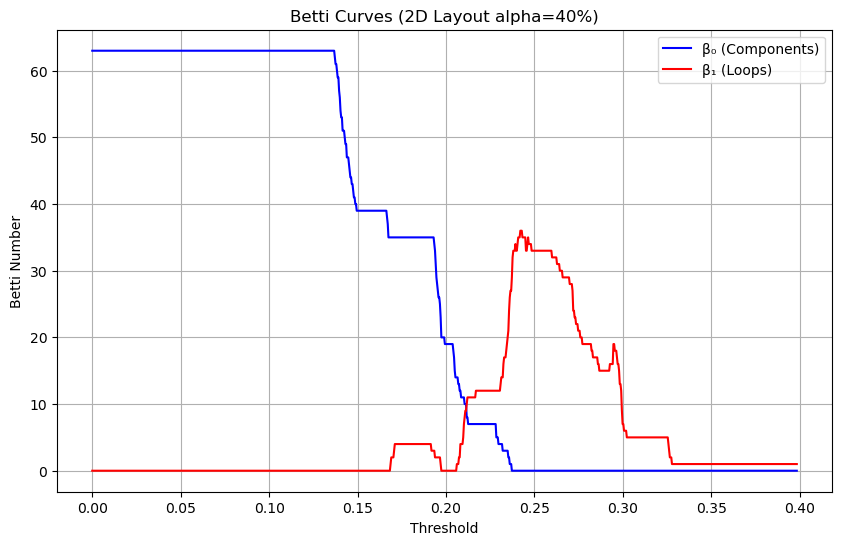

[2D Layout alpha=40%] Betti-1 value 36.0 has range [0.2420, 0.2428]
[2D Layout alpha=40%] Betti-1 value 35.0 has range [0.2408, 0.2416]
[2D Layout alpha=40%] Betti-1 value 35.0 has range [0.2432, 0.2448]
[2D Layout alpha=40%] Betti-1 value 35.0 has range [0.2464, 0.2464]
[2D Layout alpha=40%] Betti-1 value 34.0 has range [0.2392, 0.2392]
[2D Layout alpha=40%] Betti-1 value 34.0 has range [0.2404, 0.2404]
[2D Layout alpha=40%] Betti-1 value 34.0 has range [0.2460, 0.2460]
[2D Layout alpha=40%] Betti-1 value 34.0 has range [0.2468, 0.2480]
[2D Layout alpha=40%] Betti-1 value 33.0 has range [0.2380, 0.2388]
[2D Layout alpha=40%] Betti-1 value 33.0 has range [0.2396, 0.2400]
[2D Layout alpha=40%] Betti-1 value 33.0 has range [0.2452, 0.2456]
[2D Layout alpha=40%] Betti-1 value 33.0 has range [0.2484, 0.2595]
[2D Layout alpha=40%] Betti-1 value 32.0 has range [0.2376, 0.2376]
[2D Layout alpha=40%] Betti-1 value 32.0 has range [0.2599, 0.2623]
[2D Layout alpha=40%] Betti-1 value 31.0 has ran

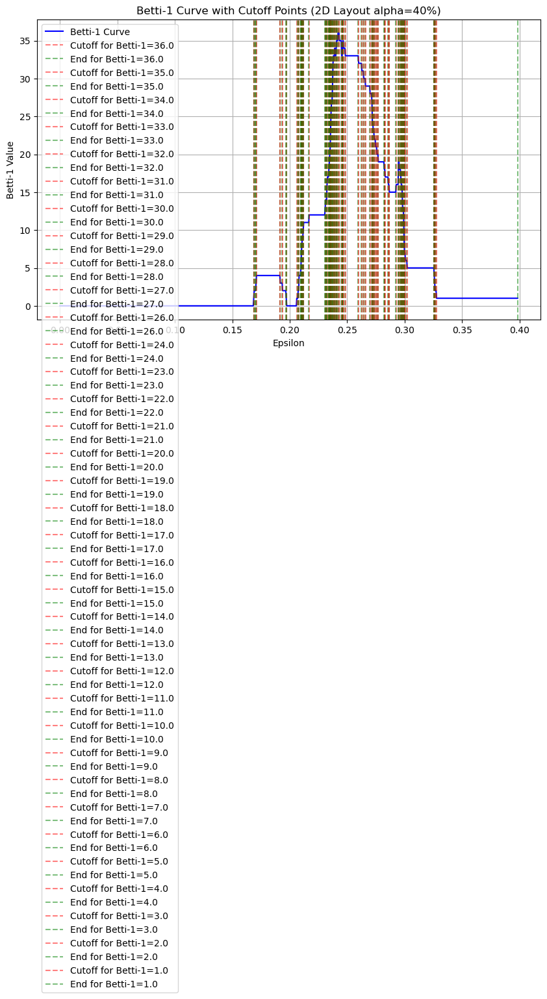

[2D Layout alpha=40%] Betti-1 value 36.0 total range: 0.0008
[2D Layout alpha=40%] Betti-1 value 35.0 total range: 0.0024
[2D Layout alpha=40%] Betti-1 value 34.0 total range: 0.0012
[2D Layout alpha=40%] Betti-1 value 33.0 total range: 0.0128
[2D Layout alpha=40%] Betti-1 value 32.0 total range: 0.0024
[2D Layout alpha=40%] Betti-1 value 31.0 total range: 0.0012
[2D Layout alpha=40%] Betti-1 value 30.0 total range: 0.0012
[2D Layout alpha=40%] Betti-1 value 29.0 total range: 0.0036
[2D Layout alpha=40%] Betti-1 value 28.0 total range: 0.0012
[2D Layout alpha=40%] Betti-1 value 27.0 total range: 0.0004
[2D Layout alpha=40%] Betti-1 value 26.0 total range: 0.0000
[2D Layout alpha=40%] Betti-1 value 24.0 total range: 0.0004
[2D Layout alpha=40%] Betti-1 value 23.0 total range: 0.0004
[2D Layout alpha=40%] Betti-1 value 22.0 total range: 0.0008
[2D Layout alpha=40%] Betti-1 value 21.0 total range: 0.0008
[2D Layout alpha=40%] Betti-1 value 20.0 total range: 0.0008
[2D Layout alpha=40%] Be

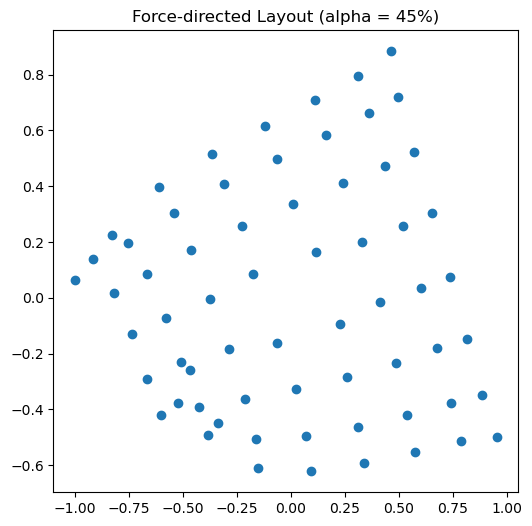


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 45%) ---


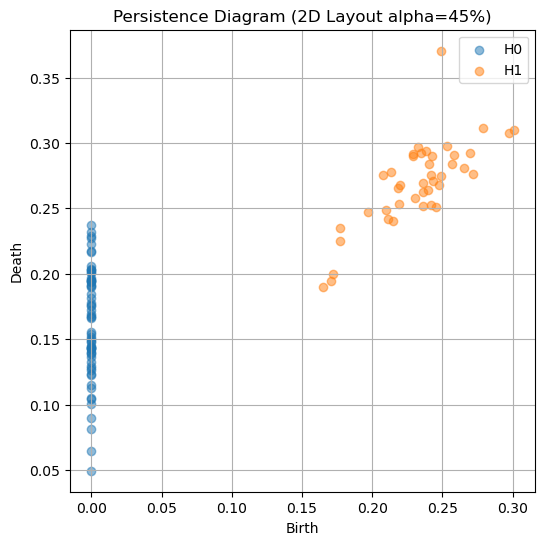

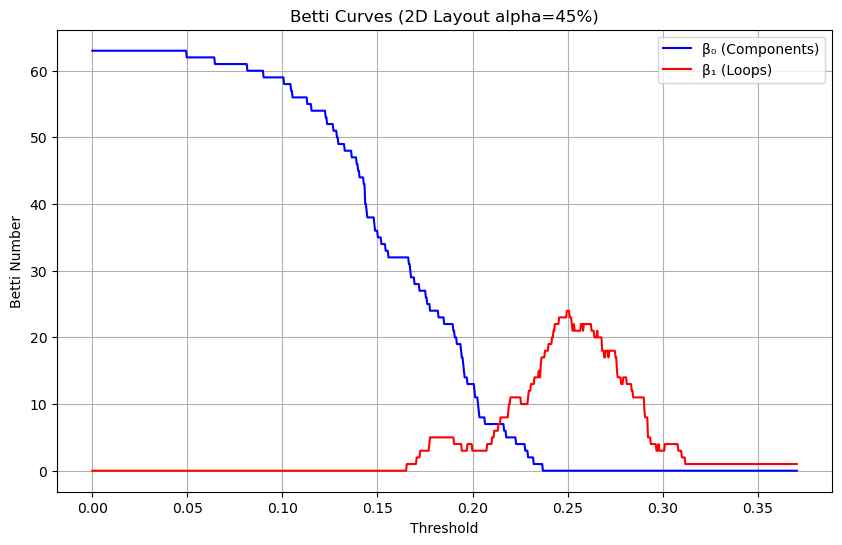

[2D Layout alpha=45%] Betti-1 value 24.0 has range [0.2496, 0.2507]
[2D Layout alpha=45%] Betti-1 value 23.0 has range [0.2455, 0.2492]
[2D Layout alpha=45%] Betti-1 value 23.0 has range [0.2511, 0.2518]
[2D Layout alpha=45%] Betti-1 value 22.0 has range [0.2433, 0.2452]
[2D Layout alpha=45%] Betti-1 value 22.0 has range [0.2522, 0.2522]
[2D Layout alpha=45%] Betti-1 value 22.0 has range [0.2533, 0.2533]
[2D Layout alpha=45%] Betti-1 value 22.0 has range [0.2570, 0.2578]
[2D Layout alpha=45%] Betti-1 value 22.0 has range [0.2585, 0.2622]
[2D Layout alpha=45%] Betti-1 value 21.0 has range [0.2426, 0.2429]
[2D Layout alpha=45%] Betti-1 value 21.0 has range [0.2526, 0.2530]
[2D Layout alpha=45%] Betti-1 value 21.0 has range [0.2537, 0.2567]
[2D Layout alpha=45%] Betti-1 value 21.0 has range [0.2581, 0.2581]
[2D Layout alpha=45%] Betti-1 value 21.0 has range [0.2626, 0.2637]
[2D Layout alpha=45%] Betti-1 value 21.0 has range [0.2656, 0.2656]
[2D Layout alpha=45%] Betti-1 value 20.0 has ran

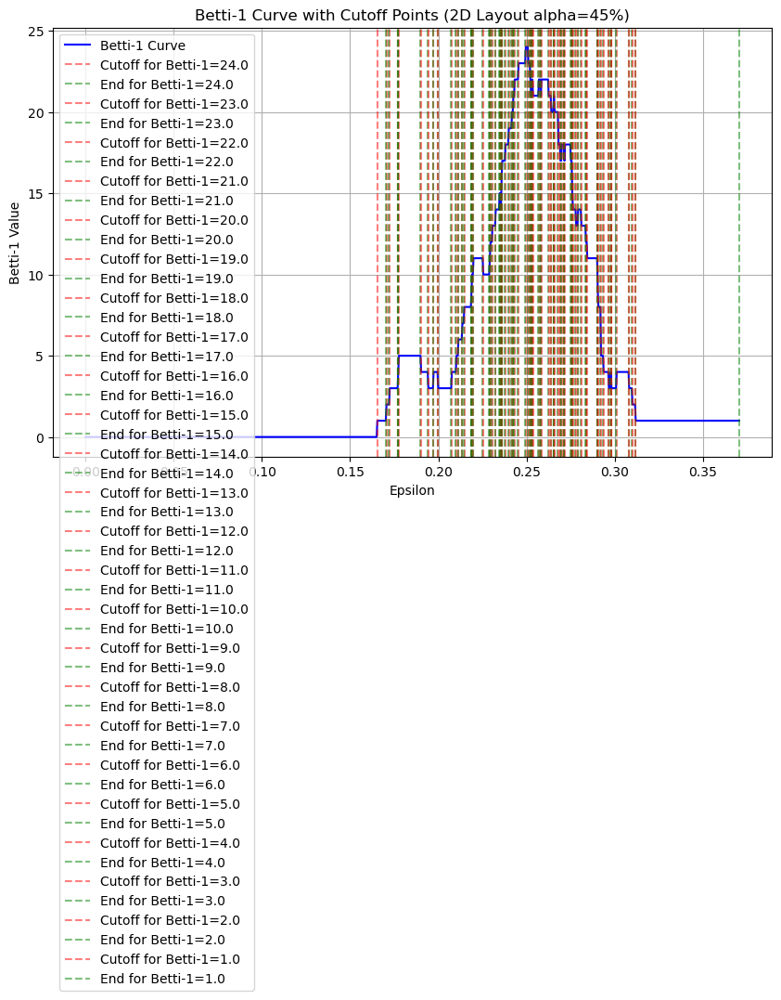

[2D Layout alpha=45%] Betti-1 value 24.0 total range: 0.0011
[2D Layout alpha=45%] Betti-1 value 23.0 total range: 0.0045
[2D Layout alpha=45%] Betti-1 value 22.0 total range: 0.0063
[2D Layout alpha=45%] Betti-1 value 21.0 total range: 0.0048
[2D Layout alpha=45%] Betti-1 value 20.0 total range: 0.0033
[2D Layout alpha=45%] Betti-1 value 19.0 total range: 0.0015
[2D Layout alpha=45%] Betti-1 value 18.0 total range: 0.0063
[2D Layout alpha=45%] Betti-1 value 17.0 total range: 0.0022
[2D Layout alpha=45%] Betti-1 value 16.0 total range: 0.0000
[2D Layout alpha=45%] Betti-1 value 15.0 total range: 0.0004
[2D Layout alpha=45%] Betti-1 value 14.0 total range: 0.0048
[2D Layout alpha=45%] Betti-1 value 13.0 total range: 0.0045
[2D Layout alpha=45%] Betti-1 value 12.0 total range: 0.0011
[2D Layout alpha=45%] Betti-1 value 11.0 total range: 0.0108
[2D Layout alpha=45%] Betti-1 value 10.0 total range: 0.0037
[2D Layout alpha=45%] Betti-1 value 9.0 total range: 0.0000
[2D Layout alpha=45%] Bet

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:78: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:79: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



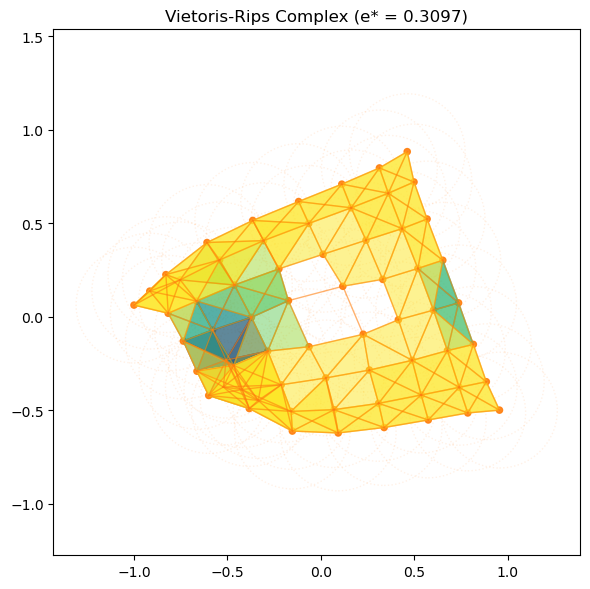

Connected Components: 1

Processing Mapper graph for alpha = 50%
For alpha = 50%, N = 9 (using mean epsilon = 0.1865)


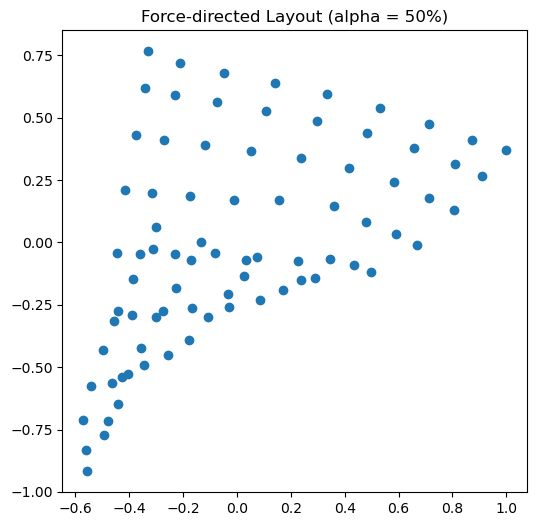


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 50%) ---


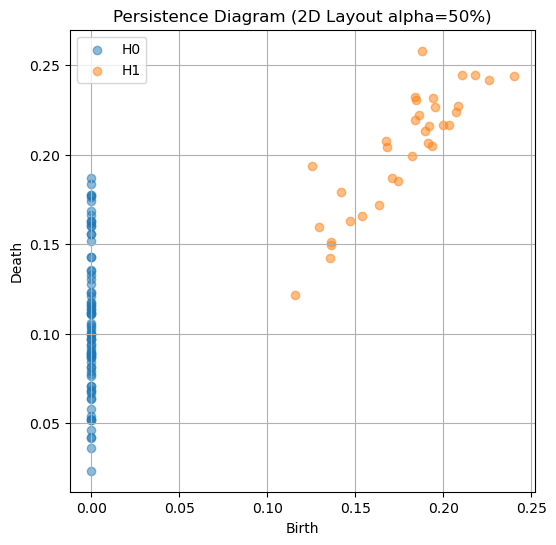

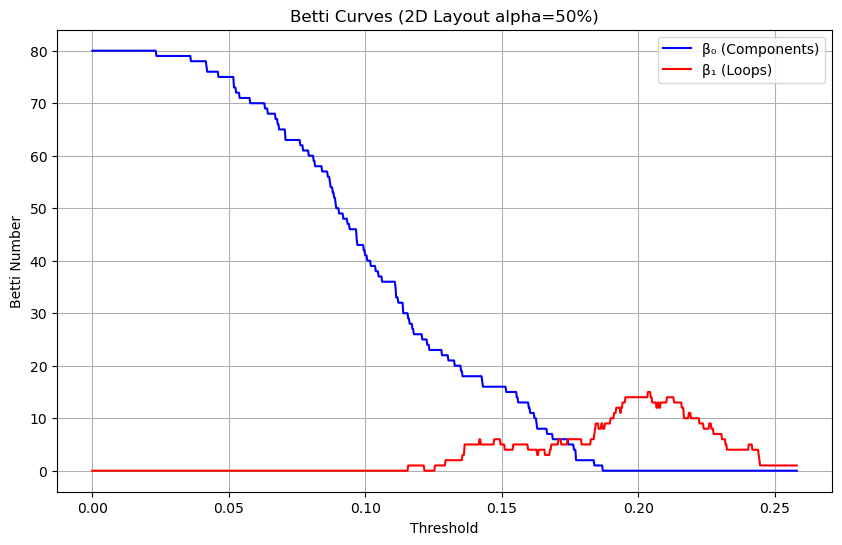

[2D Layout alpha=50%] Betti-1 value 15.0 has range [0.2035, 0.2043]
[2D Layout alpha=50%] Betti-1 value 14.0 has range [0.1953, 0.2033]
[2D Layout alpha=50%] Betti-1 value 14.0 has range [0.2046, 0.2048]
[2D Layout alpha=50%] Betti-1 value 14.0 has range [0.2105, 0.2128]
[2D Layout alpha=50%] Betti-1 value 13.0 has range [0.1943, 0.1950]
[2D Layout alpha=50%] Betti-1 value 13.0 has range [0.2051, 0.2064]
[2D Layout alpha=50%] Betti-1 value 13.0 has range [0.2072, 0.2074]
[2D Layout alpha=50%] Betti-1 value 13.0 has range [0.2082, 0.2103]
[2D Layout alpha=50%] Betti-1 value 13.0 has range [0.2131, 0.2157]
[2D Layout alpha=50%] Betti-1 value 12.0 has range [0.1919, 0.1932]
[2D Layout alpha=50%] Betti-1 value 12.0 has range [0.1937, 0.1940]
[2D Layout alpha=50%] Betti-1 value 12.0 has range [0.2066, 0.2069]
[2D Layout alpha=50%] Betti-1 value 12.0 has range [0.2077, 0.2079]
[2D Layout alpha=50%] Betti-1 value 12.0 has range [0.2159, 0.2165]
[2D Layout alpha=50%] Betti-1 value 11.0 has ran

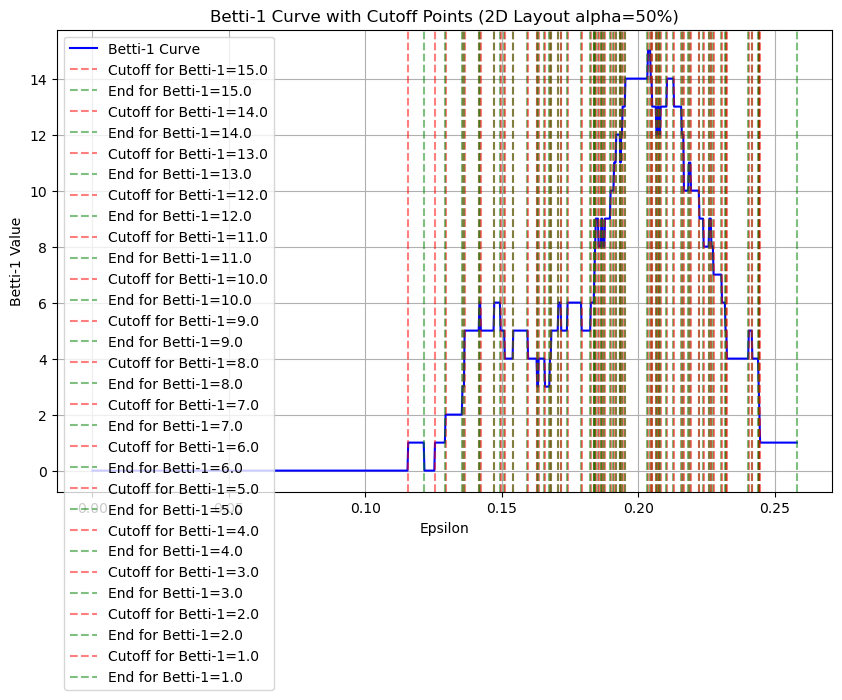

[2D Layout alpha=50%] Betti-1 value 15.0 total range: 0.0008
[2D Layout alpha=50%] Betti-1 value 14.0 total range: 0.0106
[2D Layout alpha=50%] Betti-1 value 13.0 total range: 0.0070
[2D Layout alpha=50%] Betti-1 value 12.0 total range: 0.0026
[2D Layout alpha=50%] Betti-1 value 11.0 total range: 0.0010
[2D Layout alpha=50%] Betti-1 value 10.0 total range: 0.0054
[2D Layout alpha=50%] Betti-1 value 9.0 total range: 0.0046
[2D Layout alpha=50%] Betti-1 value 8.0 total range: 0.0036
[2D Layout alpha=50%] Betti-1 value 7.0 total range: 0.0028
[2D Layout alpha=50%] Betti-1 value 6.0 total range: 0.0101
[2D Layout alpha=50%] Betti-1 value 5.0 total range: 0.0251
[2D Layout alpha=50%] Betti-1 value 4.0 total range: 0.0181
[2D Layout alpha=50%] Betti-1 value 3.0 total range: 0.0023
[2D Layout alpha=50%] Betti-1 value 2.0 total range: 0.0059
[2D Layout alpha=50%] Betti-1 value 1.0 total range: 0.0045

[2D Layout alpha=50%] Highest range Betti-1: 5.0 (total range = 0.0251)
[2D Layout alpha=50%]

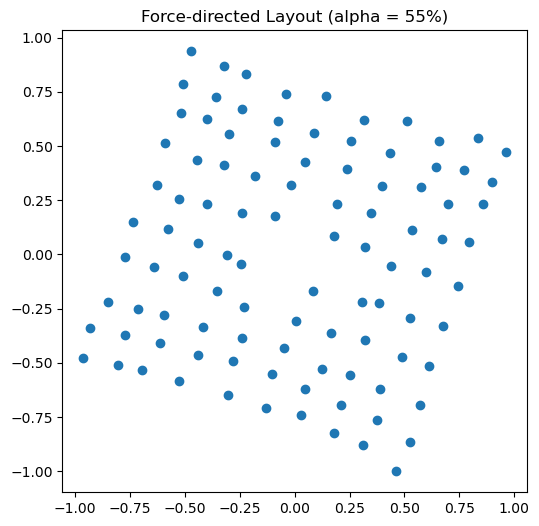


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 55%) ---


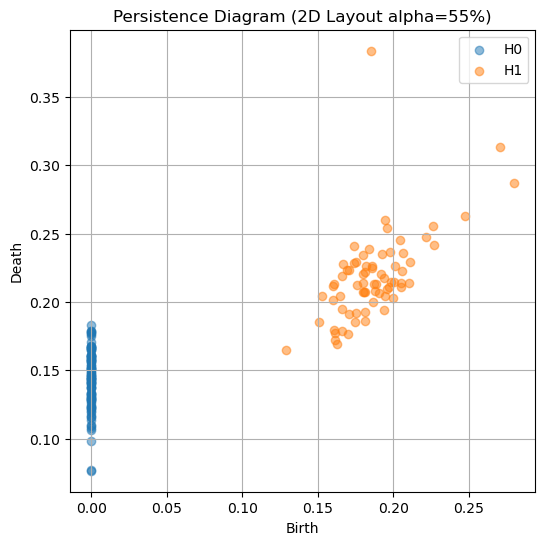

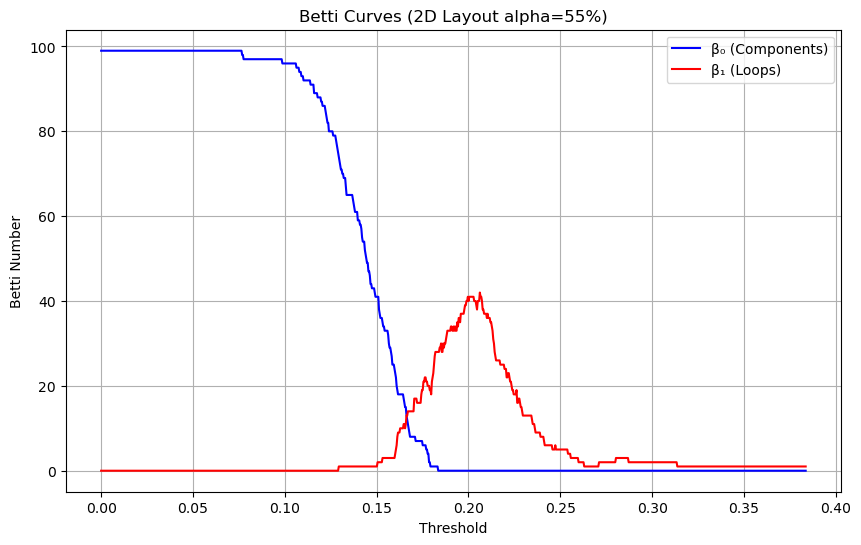

[2D Layout alpha=55%] Betti-1 value 42.0 has range [0.2062, 0.2062]
[2D Layout alpha=55%] Betti-1 value 41.0 has range [0.1997, 0.1997]
[2D Layout alpha=55%] Betti-1 value 41.0 has range [0.2004, 0.2027]
[2D Layout alpha=55%] Betti-1 value 41.0 has range [0.2066, 0.2070]
[2D Layout alpha=55%] Betti-1 value 40.0 has range [0.1989, 0.1993]
[2D Layout alpha=55%] Betti-1 value 40.0 has range [0.2001, 0.2001]
[2D Layout alpha=55%] Betti-1 value 40.0 has range [0.2031, 0.2039]
[2D Layout alpha=55%] Betti-1 value 40.0 has range [0.2050, 0.2058]
[2D Layout alpha=55%] Betti-1 value 40.0 has range [0.2073, 0.2073]
[2D Layout alpha=55%] Betti-1 value 39.0 has range [0.1981, 0.1985]
[2D Layout alpha=55%] Betti-1 value 39.0 has range [0.2043, 0.2043]
[2D Layout alpha=55%] Betti-1 value 38.0 has range [0.1977, 0.1977]
[2D Layout alpha=55%] Betti-1 value 38.0 has range [0.2047, 0.2047]
[2D Layout alpha=55%] Betti-1 value 38.0 has range [0.2077, 0.2081]
[2D Layout alpha=55%] Betti-1 value 37.0 has ran

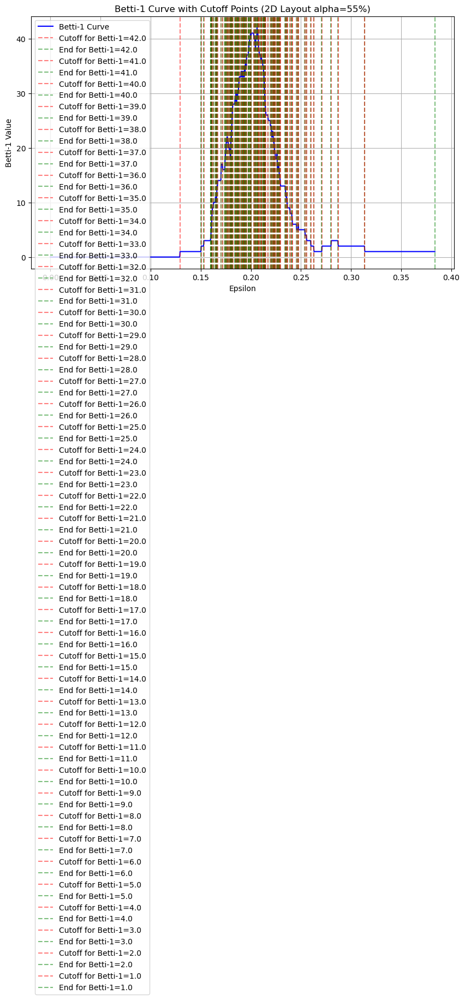

[2D Layout alpha=55%] Betti-1 value 42.0 total range: 0.0000
[2D Layout alpha=55%] Betti-1 value 41.0 total range: 0.0027
[2D Layout alpha=55%] Betti-1 value 40.0 total range: 0.0019
[2D Layout alpha=55%] Betti-1 value 39.0 total range: 0.0004
[2D Layout alpha=55%] Betti-1 value 38.0 total range: 0.0004
[2D Layout alpha=55%] Betti-1 value 37.0 total range: 0.0027
[2D Layout alpha=55%] Betti-1 value 36.0 total range: 0.0012
[2D Layout alpha=55%] Betti-1 value 35.0 total range: 0.0004
[2D Layout alpha=55%] Betti-1 value 34.0 total range: 0.0004
[2D Layout alpha=55%] Betti-1 value 33.0 total range: 0.0023
[2D Layout alpha=55%] Betti-1 value 32.0 total range: 0.0000
[2D Layout alpha=55%] Betti-1 value 31.0 total range: 0.0000
[2D Layout alpha=55%] Betti-1 value 30.0 total range: 0.0004
[2D Layout alpha=55%] Betti-1 value 29.0 total range: 0.0004
[2D Layout alpha=55%] Betti-1 value 28.0 total range: 0.0023
[2D Layout alpha=55%] Betti-1 value 27.0 total range: 0.0000
[2D Layout alpha=55%] Be

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:78: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:79: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



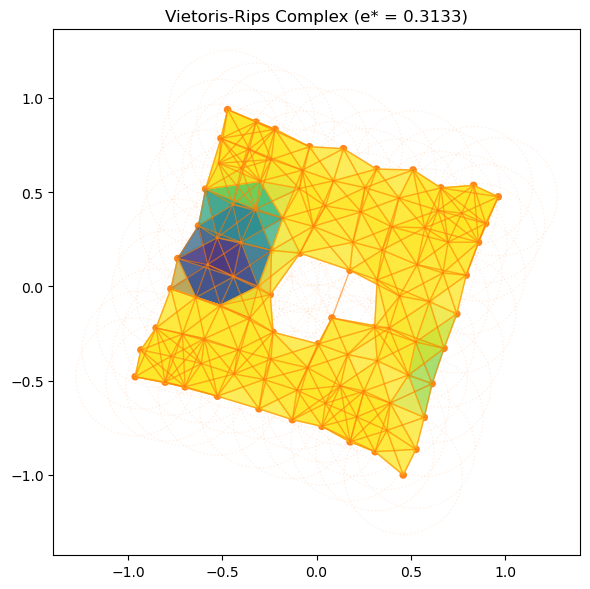

Connected Components: 1

Processing Mapper graph for alpha = 60%
For alpha = 60%, N = 11 (using mean epsilon = 0.1865)


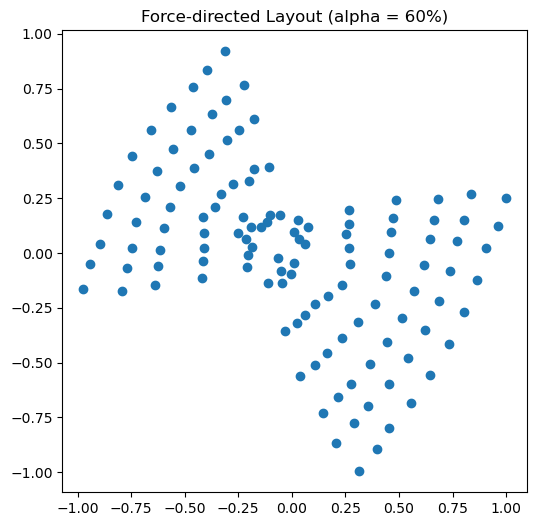


--- Running Topological Analysis on 2D Layout Coordinates (alpha = 60%) ---


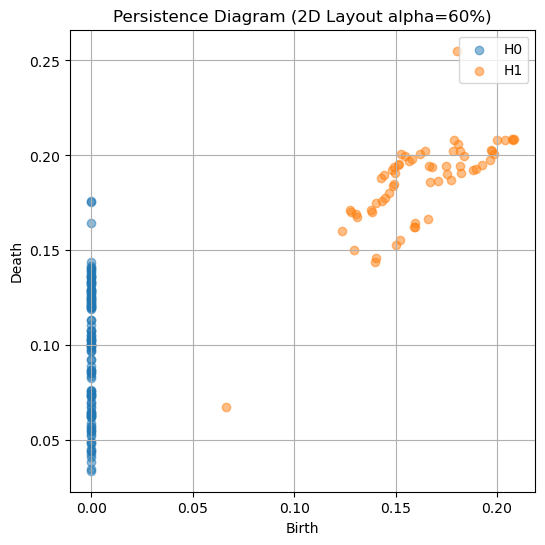

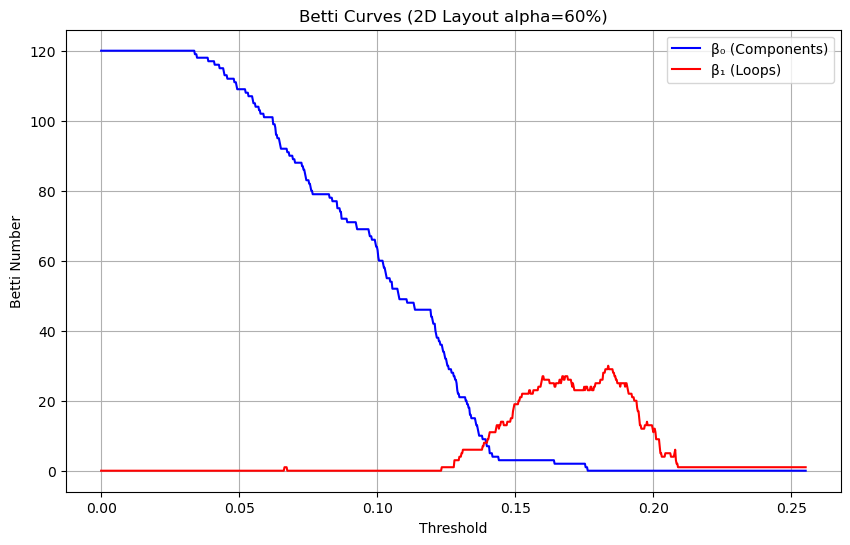

[2D Layout alpha=60%] Betti-1 value 30.0 has range [0.1836, 0.1836]
[2D Layout alpha=60%] Betti-1 value 29.0 has range [0.1826, 0.1834]
[2D Layout alpha=60%] Betti-1 value 29.0 has range [0.1839, 0.1852]
[2D Layout alpha=60%] Betti-1 value 28.0 has range [0.1818, 0.1824]
[2D Layout alpha=60%] Betti-1 value 28.0 has range [0.1854, 0.1857]
[2D Layout alpha=60%] Betti-1 value 27.0 has range [0.1599, 0.1601]
[2D Layout alpha=60%] Betti-1 value 27.0 has range [0.1670, 0.1673]
[2D Layout alpha=60%] Betti-1 value 27.0 has range [0.1681, 0.1688]
[2D Layout alpha=60%] Betti-1 value 27.0 has range [0.1859, 0.1862]
[2D Layout alpha=60%] Betti-1 value 26.0 has range [0.1596, 0.1596]
[2D Layout alpha=60%] Betti-1 value 26.0 has range [0.1604, 0.1622]
[2D Layout alpha=60%] Betti-1 value 26.0 has range [0.1660, 0.1663]
[2D Layout alpha=60%] Betti-1 value 26.0 has range [0.1668, 0.1668]
[2D Layout alpha=60%] Betti-1 value 26.0 has range [0.1675, 0.1678]
[2D Layout alpha=60%] Betti-1 value 26.0 has ran

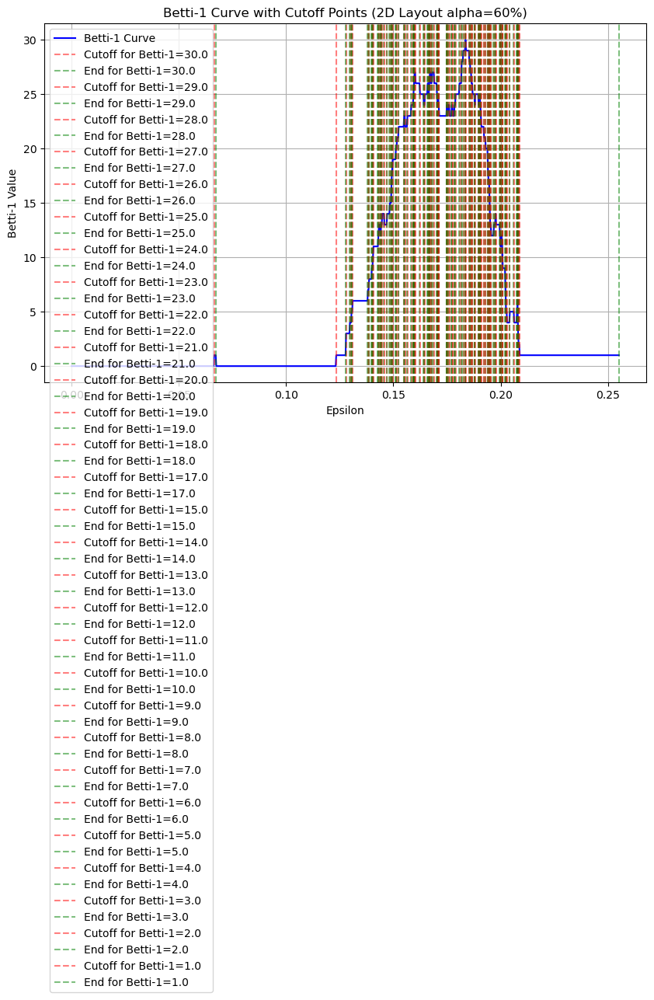

[2D Layout alpha=60%] Betti-1 value 30.0 total range: 0.0000
[2D Layout alpha=60%] Betti-1 value 29.0 total range: 0.0020
[2D Layout alpha=60%] Betti-1 value 28.0 total range: 0.0008
[2D Layout alpha=60%] Betti-1 value 27.0 total range: 0.0015
[2D Layout alpha=60%] Betti-1 value 26.0 total range: 0.0043
[2D Layout alpha=60%] Betti-1 value 25.0 total range: 0.0064
[2D Layout alpha=60%] Betti-1 value 24.0 total range: 0.0020
[2D Layout alpha=60%] Betti-1 value 23.0 total range: 0.0064
[2D Layout alpha=60%] Betti-1 value 22.0 total range: 0.0041
[2D Layout alpha=60%] Betti-1 value 21.0 total range: 0.0010
[2D Layout alpha=60%] Betti-1 value 20.0 total range: 0.0010
[2D Layout alpha=60%] Betti-1 value 19.0 total range: 0.0013
[2D Layout alpha=60%] Betti-1 value 18.0 total range: 0.0000
[2D Layout alpha=60%] Betti-1 value 17.0 total range: 0.0003
[2D Layout alpha=60%] Betti-1 value 15.0 total range: 0.0005
[2D Layout alpha=60%] Betti-1 value 14.0 total range: 0.0018
[2D Layout alpha=60%] Be

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:78: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

C:\Users\nasee\AppData\Local\Temp\ipykernel_6592\108089431.py:79: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



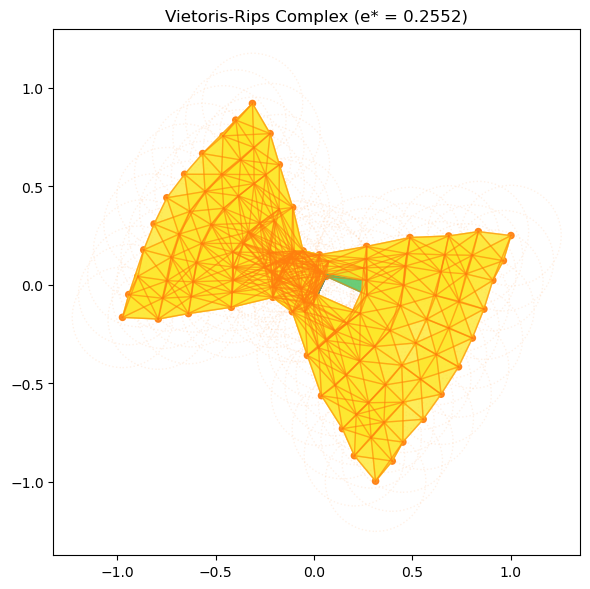

Connected Components: 1

Results DataFrame:
   %overlap  N value  Betti_1_1  Betti_1_2  epsilon_1_mean  epsilon_2_mean  \
0        10        5        2.0        2.0         0.18649         0.50037   
1        15        6        2.0        2.0         0.18649         0.37507   
2        45        8        2.0        3.0         0.18649         0.22048   
3        55       10        2.0        2.0         0.18649         0.28360   
4        60       11        2.0        1.0         0.18649         0.22056   

   epsilon_2_endpoint  
0             0.52899  
1             0.49056  
2             0.30970  
3             0.31333  
4             0.25515  


In [3]:
xyz_points = xyz_points_normalized
cutoff_betti = 1
results_df_torus = process_structural_data(xyz_points, cutoff_betti)

## Step 4 : We can only run for the most persistent betti 1 algorithm by  calling the function most_persistent_structural() with the dependency as the coordinate point data.

=== Step 1: Processing Baseline Data ===


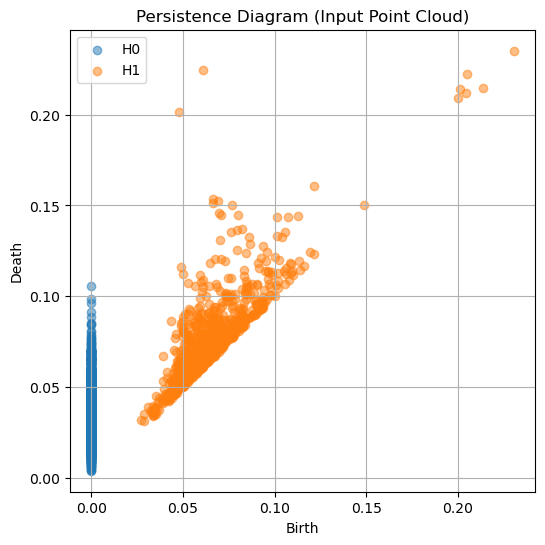

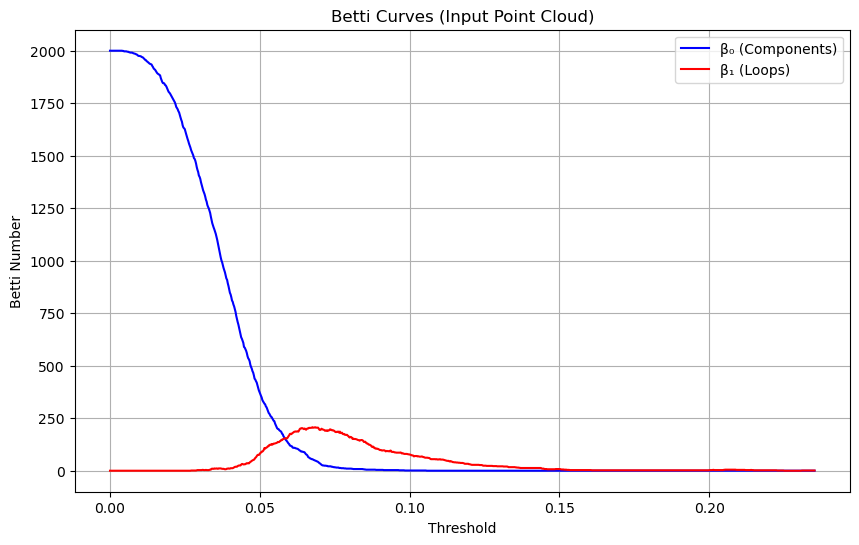

[Input Point Cloud] Betti-1 value 207.0 has range [0.0676, 0.0676]
[Input Point Cloud] Betti-1 value 207.0 has range [0.0685, 0.0685]
[Input Point Cloud] Betti-1 value 206.0 has range [0.0683, 0.0683]
[Input Point Cloud] Betti-1 value 205.0 has range [0.0673, 0.0673]
[Input Point Cloud] Betti-1 value 205.0 has range [0.0678, 0.0680]
[Input Point Cloud] Betti-1 value 205.0 has range [0.0687, 0.0694]
[Input Point Cloud] Betti-1 value 204.0 has range [0.0664, 0.0671]
[Input Point Cloud] Betti-1 value 203.0 has range [0.0640, 0.0640]
[Input Point Cloud] Betti-1 value 202.0 has range [0.0643, 0.0643]
[Input Point Cloud] Betti-1 value 201.0 has range [0.0635, 0.0638]
[Input Point Cloud] Betti-1 value 201.0 has range [0.0650, 0.0650]
[Input Point Cloud] Betti-1 value 201.0 has range [0.0659, 0.0661]
[Input Point Cloud] Betti-1 value 200.0 has range [0.0645, 0.0645]
[Input Point Cloud] Betti-1 value 200.0 has range [0.0697, 0.0697]
[Input Point Cloud] Betti-1 value 200.0 has range [0.0706, 0.0

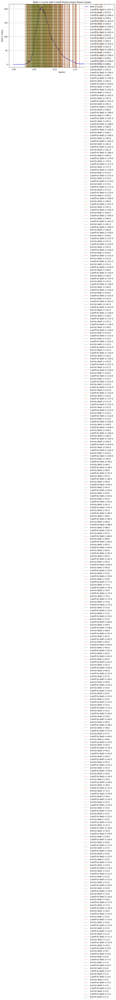

[Input Point Cloud] Betti-1 value 207.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 206.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 205.0 total range: 0.0009
[Input Point Cloud] Betti-1 value 204.0 total range: 0.0007
[Input Point Cloud] Betti-1 value 203.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 202.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 201.0 total range: 0.0005
[Input Point Cloud] Betti-1 value 200.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 199.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 198.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 197.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 196.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 195.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 194.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 193.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 192.0 total range: 0.0000
[Input Point Cloud] Betti-1 value 191.0 

In [4]:
xyz_points = xyz_points_normalized
most_persistent_structural(xyz_points)